In [1]:
import os

import numpy as np

import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

In [2]:
class ResidualBlock(nn.Module):
    def __init__(self, hidden_dim):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Linear(hidden_dim, hidden_dim),
            nn.BatchNorm1d(hidden_dim),
            nn.LeakyReLU(inplace=True),
            nn.Linear(hidden_dim, hidden_dim),
            nn.BatchNorm1d(hidden_dim)
        )

    def forward(self, x):
        return x + self.block(x)

In [3]:
class MLP(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(MLP, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(inplace=True),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(inplace=True),
            nn.Linear(hidden_dim, output_dim)
        )

    def forward(self, x):
        return self.model(x)

In [4]:
class ResNetGenerator(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_blocks, output_dim=50, num_choices=50):
        super(ResNetGenerator, self).__init__()
        self.initial_mlp = MLP(input_dim, hidden_dim, hidden_dim)
        self.resnet_blocks = nn.Sequential(*[ResidualBlock(hidden_dim) for n in range(num_blocks)])
        self.final_mlp = MLP(hidden_dim, hidden_dim, output_dim * num_choices)

        self.coordinates_range = torch.linspace(0.1, 0.6, output_dim)

        self.num_choices = num_choices

        # Hyperparamters
        self.alpha = 0.001
        self.alpha_sup = 0.01

    def update_alpha(self, normIter):
        self.alpha = (normIter/0.05) * self.alpha_sup + 1
        return self.alpha
    
    def forward(self, z, alpha):
        x = self.initial_mlp(z)
        x = self.resnet_blocks(x)
        x = self.final_mlp(x)
        
        # Reshape the output into [batch_size, 50, num_choices]
        coordinates = x.view(-1, 50, self.num_choices)  # [batch_size, 50, 50]

        # Apply softmax to generate a distribution over the choices
        coordinates = F.softmax(coordinates * alpha, dim=-1)

        # Perform the weighted sum over the predefined range
        predicted_coords = torch.sum(coordinates * self.coordinates_range, dim=-1)  # [batch_size, 50]
        
        return predicted_coords

In [5]:
#Lumerical PyTorch Wrapper requires 4 things:
#1. Implementation of forward()
#2. Calling methods in the ctx arguments
#3. Declare if the function supports double backward
#4. Validate if gradients are correct


#
class Lumerical_Wrapper(torch.autograd.Function):
    
    @staticmethod
    def forward(ctx,grating_params):
        #Rum Lumerical adjoint method here using grating params
        fom=torch.from_numpy(np.loadtxt('fom.csv',delimiter=','))
        return fom
    
    @staticmethod
    def backward(ctx,grad_out):
        gradient=torch.from_numpy(np.loadtxt('gradient.csv',delimiter=','))
        return grad_out*gradient
    
def lumerical_grad_pytorch(x):
    result=Lumerical_Wrapper.apply(x)
    return result

# grating_parameters=torch.from_numpy(np.loadtxt('params.csv',delimiter=','))
#grating_parameters = predicted_coords
#grating_parameters=grating_parameters.requires_grad_()
#loss=lumerical_grad_pytorch(torch.cos(torch.tensor(10.0))*grating_parameters)
#loss.backward()

# optimizer.zero_grad()   <- set gradient to zero
# loss.backward()   <- compute gradient
# optimizer.step()  <- gradient descent

In [6]:
# import importlib
# import FDTD_Simulation

# importlib.reload(FDTD_Simulation)

from FDTD_Simulation import FDTD_Simulation

CONFIGURATION FILE {'root': 'C:\\Program Files\\Lumerical\\v232\\api\\python', 'lumapi': 'C:\\Program Files\\Lumerical\\v232\\api\\python\\'}


Accurate interface detection enabled


C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34666499 0.3553291  0.34482843 0.35009995 0.34512752 0.34556943
 0.35082218 0.34965742 0.34984329 0.35226169 0.34972921 0.35069451
 0.34907714 0.35014915 0.34652281 0.34459302 0.34598964 0.35014573
 0.35236695 0.34930432 0.35192779 0.35302687 0.34971496 0.3530663
 0.35345083 0.34620264 0.35163495 0.35645

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34426245 0.35136226 0.35128435 0.35017818 0.34673721 0.35054499
 0.34744236 0.35033402 0.34674561 0.35060105 0.34769252 0.34871903
 0.35371876 0.34686264 0.35148042 0.35031369 0.35144567 0.34188163
 0.34930408 0.34849715 0.35124102 0.35062096 0.35017979 0.34744051
 0.3592082  0.35097197 0.3553496  0.3557

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35365969 0.35806143 0.35117611 0.35198584 0.35358566 0.34905151
 0.34693205 0.34761912 0.34508747 0.34811452 0.3461211  0.34469736
 0.34853899 0.34350091 0.34579226 0.34952885 0.35163298 0.34316945
 0.35270101 0.34626818 0.34641024 0.34680092 0.35352802 0.3515299
 0.35447356 0.34553298 0.35181755 0.35442

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34684706 0.3563886  0.35503876 0.35514307 0.35252079 0.3461926
 0.35084996 0.33704475 0.3451516  0.34612662 0.33796477 0.35143796
 0.35721543 0.34926984 0.33380139 0.34487036 0.35176945 0.35514921
 0.35290384 0.34211814 0.35176027 0.33983469 0.36219183 0.3534396
 0.36005238 0.35236248 0.3474035  0.366014

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35070032 0.36112756 0.3464984  0.35065389 0.34788775 0.34997004
 0.34193569 0.34069163 0.33521    0.34584144 0.34206256 0.34107181
 0.34770444 0.33958879 0.33710274 0.34525418 0.35061818 0.35027164
 0.35613635 0.34763667 0.34658211 0.347754   0.35762802 0.35857922
 0.36365637 0.34096703 0.34652111 0.3683

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34992516 0.35020453 0.34725168 0.35159028 0.34298673 0.34492466
 0.34527841 0.33995733 0.34362197 0.34344441 0.33881906 0.34510475
 0.35101405 0.34576666 0.34083831 0.34678528 0.35116422 0.35709599
 0.35767192 0.34476879 0.3511852  0.34784782 0.35989836 0.35228232
 0.36087644 0.35014221 0.3479197  0.3615

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.3489227  0.35570481 0.34570992 0.34524974 0.34026527 0.34571874
 0.34334719 0.3342036  0.33853084 0.33805683 0.33929348 0.34349078
 0.34721047 0.34338146 0.33578932 0.3471877  0.34991357 0.35424802
 0.36186963 0.34822354 0.35225001 0.34797576 0.35240531 0.35803702
 0.36529362 0.34360695 0.34086275 0.3663

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34308448 0.35483554 0.3496865  0.34688592 0.34480652 0.34542677
 0.33686826 0.33771849 0.33452889 0.33498612 0.32571733 0.34009439
 0.34563854 0.33422697 0.33574533 0.34460509 0.34860227 0.35862562
 0.36355877 0.35332519 0.33779687 0.34994787 0.36169466 0.36607379
 0.37406322 0.33644074 0.34529042 0.3696

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34524226 0.34913319 0.35065061 0.34378186 0.34765983 0.34921008
 0.34504598 0.33528328 0.33088025 0.33598733 0.33734423 0.34126031
 0.34681997 0.33578378 0.33281726 0.35319489 0.35368043 0.35438719
 0.36480126 0.34870851 0.35037982 0.34583482 0.3557868  0.35940498
 0.3692317  0.34490076 0.34349033 0.3677

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34253246 0.34980813 0.34202057 0.35103941 0.3415069  0.33803052
 0.33999705 0.33022246 0.33264178 0.32833996 0.32481512 0.3361814
 0.34271538 0.33821741 0.33029512 0.35174891 0.34237593 0.35929146
 0.37422734 0.34669203 0.34608111 0.34402674 0.35755807 0.36732504
 0.37043989 0.33952594 0.34062263 0.36868

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34622347 0.35227486 0.34042013 0.34842494 0.34403604 0.34237421
 0.34422463 0.32656616 0.32205564 0.33054188 0.32896909 0.33241582
 0.34233996 0.33953378 0.32809728 0.34774905 0.34537226 0.36595196
 0.37218472 0.34905145 0.34786102 0.33826181 0.35200328 0.36600503
 0.37524307 0.34331757 0.3380512  0.3736

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34768847 0.34971949 0.34921116 0.34584889 0.34452012 0.34233683
 0.33812484 0.33439875 0.33573681 0.33271176 0.32797807 0.33515161
 0.34228837 0.33323327 0.33295512 0.3498655  0.34640488 0.36213946
 0.36301368 0.35540178 0.35309538 0.34471732 0.34573823 0.36334825
 0.37204924 0.33872038 0.3388145  0.3680

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34925082 0.34773859 0.3439706  0.34541094 0.3425402  0.34302542
 0.33801609 0.32891288 0.31878993 0.32464904 0.32706022 0.32588318
 0.34101829 0.32921502 0.32975903 0.35089499 0.34752268 0.36464012
 0.37264341 0.35657766 0.34784234 0.34265882 0.347931   0.37016401
 0.3797231  0.34059596 0.33782864 0.3705

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34871688 0.34643286 0.34656212 0.34503654 0.3413496  0.34567872
 0.34158972 0.33356202 0.32998142 0.33687344 0.33129814 0.33850154
 0.34296811 0.33492187 0.33355439 0.35338265 0.34879971 0.3570967
 0.36523005 0.3553862  0.35261381 0.3432467  0.35355657 0.36290413
 0.37140185 0.34059811 0.33462167 0.37105

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34574541 0.34091663 0.34504968 0.33797845 0.33539033 0.33817324
 0.33336678 0.32654104 0.32573292 0.31766295 0.31894988 0.32679519
 0.33471113 0.32922205 0.32692152 0.35521454 0.33875731 0.37830129
 0.38305873 0.35708335 0.35802272 0.3420766  0.34646332 0.38256675
 0.38479227 0.34053546 0.33230755 0.3702

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34138966 0.34331346 0.34084806 0.34669396 0.33639503 0.33906221
 0.33987251 0.31322169 0.30952874 0.31888923 0.31536758 0.32656798
 0.33459669 0.32709086 0.32041851 0.36051616 0.34800088 0.36614341
 0.38164851 0.35874242 0.35550949 0.3323023  0.35201877 0.37488034
 0.38493729 0.3463698  0.32686606 0.3861

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34542787 0.33815771 0.34854785 0.34029654 0.33403346 0.33860257
 0.33961228 0.3194105  0.32246599 0.31883827 0.31209791 0.32425743
 0.33778256 0.3309274  0.3251029  0.36543337 0.34195355 0.37400922
 0.38385123 0.36215097 0.35984021 0.33197477 0.34750351 0.38074097
 0.38973707 0.34818655 0.33023548 0.3803

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34804526 0.34406632 0.34233055 0.33752683 0.3358199  0.33496997
 0.33590162 0.32276493 0.31854317 0.3152203  0.31686407 0.32239023
 0.33522642 0.32409871 0.32728586 0.36257419 0.34488207 0.37203383
 0.37805638 0.3603093  0.35905862 0.33947662 0.34724158 0.38321593
 0.38394713 0.33975902 0.32758635 0.3790

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34342575 0.34271562 0.34075937 0.33457366 0.33229631 0.33363211
 0.33793786 0.31640059 0.31298503 0.31463182 0.31212467 0.31971902
 0.33123922 0.32188311 0.32819033 0.36125553 0.3503027  0.37741044
 0.38615131 0.3627592  0.36344165 0.33476341 0.34430584 0.38484606
 0.39342716 0.34668359 0.32593769 0.3870

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35612592 0.34909305 0.344823   0.33661053 0.32943416 0.34234977
 0.33134267 0.31461856 0.30262083 0.31464422 0.31233194 0.31496081
 0.33354986 0.32450321 0.33211598 0.36663336 0.34974939 0.37811637
 0.39117482 0.37443194 0.36371049 0.33616504 0.34113213 0.38243222
 0.3965075  0.34500313 0.33278161 0.3881

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  self.fig, self.ax = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))
C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34545356 0.33942091 0.33783248 0.33377823 0.32111171 0.3365052
 0.33806568 0.32144204 0.31787181 0.3151201  0.31987256 0.32140887
 0.33606735 0.32423151 0.32745934 0.36438093 0.35102698 0.37960964
 0.38792485 0.36754069 0.36429965 0.33264181 0.34146133 0.38105622
 0.39723691 0.35225475 0.33044037 0.38905

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34404653 0.33292255 0.33990967 0.33045757 0.32375193 0.31897426
 0.33489421 0.31077212 0.30883479 0.30324048 0.30300108 0.31358424
 0.3278906  0.31506678 0.33023199 0.37640971 0.35103896 0.38885263
 0.40204051 0.37691316 0.36541566 0.33050552 0.33838814 0.39456284
 0.40728673 0.34064791 0.32524905 0.3922

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34525144 0.33430344 0.33666819 0.32015872 0.32011563 0.32700992
 0.33758399 0.31528783 0.31833297 0.31122977 0.31099689 0.31791389
 0.32804206 0.31651583 0.33018234 0.37798131 0.35150209 0.38470227
 0.39821905 0.37912074 0.37118909 0.331384   0.34036738 0.39804685
 0.40759018 0.34652945 0.32727909 0.3970

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.33992019 0.32860628 0.33072275 0.32305646 0.32333261 0.32467777
 0.3398056  0.31112587 0.31575394 0.31117046 0.30997011 0.32077798
 0.32840458 0.31770447 0.32056156 0.3732678  0.35691121 0.39230895
 0.40016511 0.37302729 0.37697041 0.32816297 0.34207442 0.39190161
 0.40712538 0.35424373 0.32782215 0.3969

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.3428939  0.31951782 0.32215461 0.3036173  0.30714902 0.31325489
 0.3334654  0.30764437 0.31696519 0.3086625  0.30472019 0.31962103
 0.32810178 0.31279969 0.32681993 0.38202798 0.35427618 0.39803192
 0.407038   0.37856197 0.3825568  0.32638955 0.33800215 0.40104058
 0.41331974 0.3505491  0.32044688 0.3987

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.3433142  0.33356267 0.32943043 0.32657254 0.32299158 0.31986389
 0.33743984 0.31897667 0.31871316 0.31356028 0.32103059 0.32236689
 0.33436283 0.32030201 0.33325177 0.37780955 0.35502592 0.39381659
 0.39405572 0.37931305 0.3683154  0.34099329 0.34336561 0.39121822
 0.39635381 0.34826458 0.33017209 0.3987

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.3355298  0.32710373 0.32137933 0.31602097 0.30698785 0.31876245
 0.33953509 0.30957592 0.32186607 0.3143906  0.31556723 0.32149634
 0.33488613 0.31264362 0.33048576 0.38406599 0.36480144 0.40173042
 0.40317127 0.38016945 0.37125421 0.32768813 0.33229849 0.40212899
 0.41201225 0.35588449 0.32157034 0.4008

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34071559 0.32309657 0.32459736 0.31430531 0.31347603 0.31176656
 0.33230466 0.31727639 0.31665707 0.31518057 0.31055802 0.31911251
 0.33879033 0.31449118 0.33268809 0.38632655 0.36105394 0.3979044
 0.40782237 0.37880331 0.37273768 0.33093154 0.33648747 0.40647817
 0.40613189 0.3403016  0.32679966 0.39483

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34715679 0.33199334 0.3316789  0.32547408 0.32742947 0.32492831
 0.34001517 0.33037826 0.33403018 0.32711199 0.32622075 0.32965147
 0.34040704 0.32702363 0.33965641 0.37284732 0.35915571 0.38527331
 0.38921702 0.36888036 0.36466461 0.33339858 0.33673358 0.37923852
 0.38718149 0.34517336 0.33225995 0.3832

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34337625 0.33419394 0.33811316 0.32492971 0.32283112 0.32532474
 0.343853   0.32560986 0.32465535 0.32876414 0.32636774 0.32867536
 0.34364641 0.32169306 0.3400656  0.3794896  0.3662481  0.39205694
 0.39239454 0.37211001 0.36708772 0.33215734 0.33820039 0.38336146
 0.39321929 0.34788099 0.32949519 0.3824

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34024084 0.32463455 0.32787901 0.32258892 0.31880069 0.31743342
 0.3414318  0.32243735 0.33037463 0.32753518 0.32556677 0.32945234
 0.34383377 0.32049674 0.33769408 0.3816458  0.36751458 0.39796978
 0.40045351 0.37246108 0.36786348 0.32431966 0.33685985 0.38546926
 0.39280164 0.34775162 0.32286263 0.3853

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.3422406  0.32981881 0.32660064 0.31985176 0.31955242 0.31933805
 0.34018189 0.32540905 0.32770726 0.32780486 0.3213608  0.32642427
 0.33462968 0.31924224 0.33265355 0.38165447 0.36425775 0.39527115
 0.39894843 0.37729442 0.36391646 0.32932416 0.33038411 0.38983148
 0.39629743 0.34292758 0.32551771 0.3883

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34084854 0.32397467 0.33048064 0.31205693 0.3118242  0.31915927
 0.3431938  0.31130558 0.32749408 0.32189777 0.32224545 0.32863554
 0.34021002 0.3114768  0.34071314 0.39160031 0.37605762 0.39490065
 0.41198412 0.37634587 0.36694112 0.32019633 0.32780692 0.39155358
 0.4021745  0.346077   0.31546816 0.3932

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.33915752 0.32407558 0.32535881 0.31654125 0.31417888 0.31897321
 0.34161085 0.32283455 0.33066306 0.32320839 0.32275835 0.32202598
 0.33653834 0.30407295 0.33377287 0.38324624 0.36304641 0.40388221
 0.41325653 0.3784543  0.3594594  0.32067257 0.32604015 0.39705342
 0.41003528 0.3427012  0.31467617 0.3896

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.33941978 0.31731609 0.32589412 0.30558693 0.31258389 0.30972818
 0.33736041 0.31757277 0.32236367 0.31322664 0.31624222 0.31613231
 0.33034781 0.29305968 0.33355731 0.38613003 0.36522049 0.41622886
 0.41985336 0.38324654 0.35810524 0.31791094 0.3217743  0.40553522
 0.41350037 0.32862231 0.30586377 0.3955

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34220582 0.32253212 0.32843024 0.32403409 0.31352258 0.31754422
 0.34136158 0.31794256 0.32961926 0.32195649 0.32667693 0.32542059
 0.33942556 0.31651217 0.33509704 0.3930099  0.37240458 0.39321995
 0.40593573 0.37023348 0.36332902 0.31908908 0.32818547 0.38975081
 0.39911646 0.34647128 0.31564689 0.3873

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.33433783 0.31430361 0.32570812 0.30675697 0.30894607 0.30863544
 0.3328436  0.30475053 0.32941714 0.31667683 0.31415865 0.32069749
 0.3340455  0.3026264  0.33287734 0.39244068 0.37077093 0.41380274
 0.41596818 0.37314394 0.36815593 0.31115344 0.31800053 0.39244577
 0.40773085 0.34324813 0.31066507 0.3930

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34107393 0.32164812 0.32839817 0.31034619 0.31383955 0.30892774
 0.33832031 0.31760198 0.32794562 0.31644499 0.31733629 0.32489717
 0.33233324 0.29914233 0.3361395  0.39153409 0.36857095 0.4016507
 0.41389006 0.36980695 0.35813853 0.32035154 0.31849292 0.39164194
 0.4012405  0.33312154 0.30743891 0.39053

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.33839059 0.31338155 0.3312217  0.30397707 0.30843887 0.30268353
 0.33746454 0.30622724 0.3235296  0.31479847 0.31462526 0.32141751
 0.33020163 0.29831249 0.32814139 0.38842976 0.37278557 0.41277534
 0.41868594 0.37530535 0.36153513 0.30723682 0.31595138 0.38880503
 0.40414274 0.33604288 0.30312535 0.3940

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34603262 0.33063996 0.33497912 0.32649007 0.32658964 0.32750919
 0.34139836 0.3282572  0.33370739 0.33206645 0.33355331 0.333464
 0.34048006 0.32253501 0.34239894 0.37510005 0.35683149 0.38082099
 0.38863745 0.35931581 0.35681501 0.32702386 0.33007765 0.37439334
 0.38246205 0.34454453 0.32382202 0.372015

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34028822 0.31981638 0.33085182 0.31252545 0.30783704 0.30857161
 0.32959339 0.30902052 0.32371733 0.31796601 0.31555927 0.3155655
 0.3342154  0.29446846 0.3319788  0.38327563 0.3637256  0.40954292
 0.41132861 0.37091464 0.35410097 0.3093842  0.31425905 0.38200644
 0.40420744 0.33145812 0.30041069 0.38568

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34503862 0.31871518 0.33426368 0.3063972  0.3165381  0.30982032
 0.33650297 0.31009838 0.32377157 0.31472063 0.30926165 0.3153581
 0.32769996 0.29173028 0.32838398 0.38552791 0.36669606 0.40704456
 0.41728103 0.36612582 0.35762244 0.30218646 0.30935892 0.39425129
 0.40590674 0.3332969  0.30137041 0.39918

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.33397919 0.31433538 0.3392978  0.30186683 0.31562802 0.30455205
 0.32989529 0.30176812 0.31655297 0.30323589 0.31384429 0.31188485
 0.32386249 0.27874571 0.32844526 0.39060998 0.36284786 0.42573065
 0.42217711 0.37661874 0.35811168 0.3024793  0.30015832 0.3997463
 0.41388267 0.32191482 0.29614359 0.39744

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.33571789 0.31583858 0.33477026 0.31132892 0.31028712 0.30545694
 0.3320604  0.30123681 0.31499559 0.31272388 0.31296146 0.31593746
 0.32845831 0.29113603 0.32894567 0.38523853 0.36671934 0.41386962
 0.42392537 0.36107072 0.35548007 0.29629263 0.3041738  0.3935335
 0.40807858 0.33375424 0.30261162 0.39155

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.341694   0.32464328 0.33978942 0.31973457 0.32562959 0.31496686
 0.34235999 0.31213045 0.32653737 0.31855077 0.31985369 0.32386392
 0.33431131 0.30672994 0.32879725 0.37473947 0.36197492 0.40314287
 0.40656084 0.36319247 0.35261482 0.31068575 0.31612092 0.38349852
 0.38838828 0.33522311 0.31271887 0.3833

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34561747 0.3217043  0.33608308 0.31836981 0.32359526 0.31137317
 0.33268696 0.3171365  0.32379007 0.32425228 0.32238898 0.32228178
 0.33223933 0.30048501 0.33564049 0.37666115 0.36158839 0.39301807
 0.40796337 0.36090928 0.34987625 0.31459814 0.31561008 0.37657502
 0.39377898 0.33596677 0.31108403 0.3825

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34049127 0.31841567 0.33635569 0.30504853 0.31000215 0.30543545
 0.33296072 0.30163157 0.31718317 0.30683219 0.30517134 0.31497949
 0.32276151 0.27786082 0.32066965 0.38236624 0.35491034 0.41629279
 0.42760408 0.36610624 0.35656711 0.3005223  0.31032783 0.39731374
 0.40814522 0.32684401 0.29356721 0.3924

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.33746499 0.31836841 0.34250614 0.31079972 0.3168591  0.30453643
 0.33262482 0.29526633 0.31502238 0.3098897  0.31284726 0.31586894
 0.33072796 0.27832115 0.32373548 0.38213155 0.37293985 0.41809687
 0.43417159 0.36884508 0.34844387 0.29691127 0.30228841 0.39386776
 0.41106084 0.33588222 0.29424655 0.4027

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.33886069 0.31260538 0.33969766 0.30778939 0.31656033 0.30386549
 0.32841519 0.29673725 0.31701282 0.30646685 0.3055976  0.30906409
 0.32568148 0.27969363 0.31077251 0.38130856 0.35969174 0.42293841
 0.43786407 0.37074119 0.35296163 0.28985682 0.30142891 0.40313217
 0.41447622 0.33247259 0.29415536 0.3972

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34539384 0.3266905  0.35255378 0.31702679 0.32879686 0.31447563
 0.34479269 0.31677958 0.3332217  0.31860402 0.32252103 0.32347634
 0.33415025 0.29513621 0.3324725  0.37135145 0.36049247 0.41010442
 0.41569486 0.36218244 0.35213083 0.31428999 0.309311   0.39345756
 0.39090857 0.33441633 0.30622688 0.3862

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.33550501 0.32498863 0.34575635 0.31452543 0.31893298 0.31385577
 0.33705041 0.31254247 0.32628718 0.31817147 0.31729746 0.31513435
 0.33161697 0.28013229 0.32340795 0.36909121 0.35507962 0.41765904
 0.42908984 0.37396631 0.34564498 0.30459023 0.30218774 0.3990545
 0.4081862  0.32640013 0.3026942  0.39850

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34358025 0.31455782 0.3466697  0.31664249 0.3249107  0.31408155
 0.3397547  0.30318928 0.32699823 0.31744277 0.31787446 0.32797846
 0.33624938 0.28809598 0.32221407 0.37671173 0.36554882 0.40663159
 0.41934991 0.36300394 0.35876867 0.30600107 0.31079471 0.38651586
 0.40259776 0.33477443 0.29475722 0.3937

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34510952 0.32743108 0.34373263 0.32508421 0.32536006 0.31644997
 0.3405596  0.31296557 0.32976818 0.32410207 0.32818297 0.32283583
 0.33803689 0.29563305 0.3315967  0.37027127 0.35621411 0.40307328
 0.41423759 0.36275345 0.34958464 0.31071064 0.31639501 0.38327396
 0.39593852 0.34046343 0.30414876 0.3893

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34451938 0.32751277 0.34656692 0.31457093 0.32940391 0.31711182
 0.33640829 0.31229177 0.33029374 0.32098708 0.31969309 0.31931922
 0.32958055 0.28173184 0.32421967 0.37144554 0.35655919 0.40655041
 0.42042419 0.37060642 0.35417983 0.30813819 0.30994248 0.39851514
 0.40546817 0.32768828 0.30098599 0.3995

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34999794 0.33514094 0.34908655 0.33478069 0.33903718 0.32919592
 0.34208387 0.33055761 0.33632827 0.33323386 0.33639184 0.33144018
 0.34109437 0.31090805 0.33720484 0.36074707 0.35421884 0.38171843
 0.39737755 0.35697785 0.35023752 0.3293449  0.32658604 0.37154454
 0.38390765 0.34026691 0.32401603 0.3774

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34142148 0.32116267 0.34579998 0.31637937 0.32944393 0.30608103
 0.34033623 0.3004927  0.3234483  0.31638756 0.31699121 0.31471485
 0.33204937 0.28174531 0.31818408 0.36777142 0.35778078 0.41596144
 0.42857772 0.36893409 0.35167021 0.29623106 0.30921167 0.39419216
 0.40442792 0.33674619 0.30230996 0.3981

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34662989 0.32534233 0.35101277 0.31898421 0.32950276 0.31837499
 0.33656678 0.31312007 0.32890812 0.31982782 0.33066282 0.31798318
 0.33301145 0.28456748 0.3289097  0.36612236 0.35541937 0.40584925
 0.42712668 0.36636832 0.35345843 0.30675361 0.31421366 0.38506824
 0.40311134 0.33000562 0.30363774 0.3969

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.3452943  0.33233944 0.34657276 0.32046595 0.32966569 0.31879157
 0.34161419 0.31222069 0.32804608 0.32372284 0.3208943  0.32283366
 0.33105692 0.28682739 0.32415929 0.3590067  0.35464203 0.41224355
 0.42609057 0.36641997 0.3488889  0.30996886 0.30930993 0.40150884
 0.4066934  0.33653697 0.30783877 0.3983

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34641007 0.32930234 0.35512018 0.31521326 0.33098817 0.31883365
 0.33619428 0.31200084 0.33350214 0.32169855 0.32341281 0.31725925
 0.33034629 0.27954343 0.32760224 0.36013186 0.35389629 0.40990001
 0.42747381 0.36892644 0.35269272 0.30806136 0.3174845  0.39739868
 0.40604064 0.33405626 0.30936366 0.4041

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34661001 0.32886112 0.34654328 0.32766905 0.33195019 0.31513679
 0.34236783 0.31512746 0.33141097 0.32388395 0.32510728 0.32873333
 0.33616579 0.29389948 0.33109516 0.36228919 0.35526317 0.40709466
 0.42612651 0.36194456 0.35324174 0.31671622 0.31681389 0.3863607
 0.39818695 0.34137794 0.31045082 0.39318

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35169116 0.32833278 0.35142037 0.32328162 0.33391556 0.3200191
 0.34096265 0.31170318 0.3286303  0.32268202 0.32786509 0.3259705
 0.33777213 0.29353073 0.33026612 0.3659215  0.35892415 0.40067005
 0.42802387 0.36435759 0.35760999 0.31144232 0.31349277 0.39321062
 0.40378574 0.3378748  0.30711082 0.394893

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.33679637 0.32658294 0.35351235 0.31278533 0.32550287 0.30994546
 0.3423661  0.29847503 0.3291209  0.31528977 0.31273454 0.31882215
 0.32652715 0.26679969 0.32198042 0.35965407 0.35490766 0.43447015
 0.44599363 0.37892529 0.35130078 0.30156687 0.30896294 0.40962398
 0.4181439  0.33075145 0.29360873 0.4075

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35156339 0.33413175 0.34783691 0.32346249 0.33517066 0.31731099
 0.3402096  0.31130907 0.33388048 0.32387853 0.32013887 0.32478973
 0.32920206 0.28729013 0.33155087 0.35948148 0.35482979 0.40492421
 0.4229387  0.3614147  0.3546578  0.31613484 0.3161253  0.39206541
 0.39959458 0.33390459 0.31236002 0.3947

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34742743 0.32642865 0.35405108 0.31458932 0.3313795  0.31331587
 0.33756992 0.30161333 0.32043883 0.31516531 0.31958658 0.31515998
 0.33643273 0.26927763 0.32856229 0.36175662 0.35231835 0.42802683
 0.453309   0.37797207 0.34688002 0.30382141 0.29944193 0.41025934
 0.42650613 0.33702189 0.29817712 0.4230

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35401177 0.32609898 0.35196427 0.31236821 0.33098295 0.30555436
 0.33870378 0.29935059 0.32067189 0.31526625 0.31121206 0.31775954
 0.32458359 0.2716552  0.32118815 0.36049542 0.35603756 0.43021271
 0.45085397 0.37352842 0.35273224 0.30439794 0.3086237  0.41223639
 0.41955569 0.33298615 0.30125538 0.4162

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35072824 0.33823586 0.35674047 0.33262557 0.34089687 0.3298597
 0.34327534 0.32527566 0.33419019 0.32527417 0.33579254 0.33179638
 0.34502003 0.30220115 0.3410399  0.36548406 0.35731083 0.39416856
 0.41555271 0.36331886 0.3543734  0.32348251 0.32243487 0.38931078
 0.39428791 0.3442618  0.32608536 0.39721

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34975636 0.32405269 0.35405979 0.31711251 0.33073577 0.31859821
 0.33795753 0.30807984 0.33220261 0.32633936 0.33338404 0.3237671
 0.3434701  0.28193885 0.33238515 0.36446217 0.36074737 0.40975118
 0.43480352 0.37417087 0.35609299 0.31516299 0.31428912 0.39824128
 0.41186047 0.33694547 0.30299005 0.40268

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34742126 0.32815754 0.35201988 0.31906632 0.33789659 0.3106139
 0.34114817 0.30806836 0.33014011 0.32418743 0.32407168 0.32121342
 0.33490631 0.28087211 0.33237231 0.36257437 0.35698459 0.41488689
 0.43760818 0.37093291 0.34947151 0.3134791  0.31615549 0.40255255
 0.41361913 0.33789837 0.3084079  0.40509

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35302487 0.33889869 0.34719592 0.33091825 0.33646107 0.31980631
 0.34087437 0.3205727  0.33244401 0.32847032 0.33332363 0.3279424
 0.34366152 0.30014127 0.34015709 0.35767338 0.3583096  0.39904737
 0.41783297 0.3682856  0.35442317 0.32336879 0.32390794 0.38944918
 0.39213425 0.33842248 0.3171618  0.39391

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35363814 0.3262445  0.34915078 0.30340829 0.32619017 0.29830039
 0.33126929 0.29093876 0.32292047 0.3172192  0.31049472 0.31103414
 0.32517779 0.25796822 0.3201949  0.37063411 0.36392042 0.4310365
 0.45515478 0.38000333 0.35422599 0.29942086 0.30796498 0.42090204
 0.42729747 0.3289974  0.29382157 0.42682

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35056341 0.32967076 0.34452945 0.31596497 0.33829197 0.31557456
 0.33589494 0.3043305  0.32341483 0.31812927 0.32734463 0.31648842
 0.32980785 0.28176951 0.33223495 0.36334264 0.35277385 0.40885773
 0.44169751 0.37453803 0.35530975 0.31599087 0.31759304 0.40445381
 0.41090816 0.3360326  0.30811441 0.4125

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35213286 0.32874623 0.3506808  0.31415719 0.32969815 0.31145528
 0.34273568 0.30788088 0.33234572 0.3201569  0.32081857 0.32481787
 0.33874202 0.28487492 0.33329442 0.35778973 0.35921013 0.42227206
 0.44127616 0.37786466 0.35209194 0.31078112 0.31326357 0.40875012
 0.41111571 0.34018245 0.30993494 0.4084

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34927475 0.33039677 0.34705618 0.3136771  0.33246472 0.31283626
 0.33790946 0.30732799 0.33502471 0.31907058 0.32109427 0.32846487
 0.33466056 0.27822828 0.33684242 0.36294326 0.35703999 0.41100374
 0.43995899 0.37465605 0.3528859  0.31616318 0.31552967 0.40791145
 0.41304106 0.33934572 0.30242267 0.4163

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35514617 0.32320371 0.35048014 0.30475909 0.32917732 0.30028367
 0.33132985 0.29776245 0.32156754 0.31544051 0.32079601 0.31337756
 0.337825   0.26294783 0.33438665 0.36105314 0.35668498 0.43186492
 0.457239   0.38109595 0.35863993 0.30736437 0.31236619 0.41763762
 0.42589572 0.34074673 0.30212805 0.4212

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.3478387  0.32962945 0.34346715 0.30569339 0.32637581 0.31107286
 0.33263063 0.29130527 0.32792047 0.31540301 0.31761235 0.31728509
 0.33608866 0.26419252 0.32546842 0.36329269 0.35016558 0.43588352
 0.46132964 0.38310534 0.35381037 0.31072217 0.30867141 0.42290545
 0.43250144 0.33979851 0.29622874 0.4303

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35908881 0.32608882 0.34237915 0.29910162 0.32507339 0.29872373
 0.3298645  0.30038694 0.32393062 0.31873211 0.32255599 0.31602719
 0.32247478 0.2659041  0.33707276 0.35816437 0.35537764 0.41906217
 0.45429185 0.38125557 0.35484117 0.30771038 0.30648357 0.41626215
 0.42310399 0.3299503  0.29804853 0.4251

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35428494 0.32788542 0.34480143 0.31541389 0.3342281  0.30891511
 0.34180996 0.30412719 0.32605797 0.32657543 0.33133754 0.32812923
 0.34210935 0.28230166 0.33834213 0.35579056 0.36138421 0.41985661
 0.44874227 0.37151587 0.35264766 0.31125724 0.31236544 0.4014883
 0.41246197 0.34520262 0.3058449  0.41089

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34665182 0.3319084  0.3483085  0.30988485 0.32886526 0.31539375
 0.34124541 0.30690682 0.33785537 0.32424104 0.3245863  0.32247034
 0.3337262  0.27242774 0.32977158 0.35892043 0.35300881 0.41375276
 0.43433699 0.37903476 0.34372139 0.31977507 0.32006678 0.41335383
 0.41298279 0.33318457 0.30328244 0.4066

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34984574 0.32409048 0.34560904 0.30817538 0.33719915 0.31162742
 0.34610623 0.30433643 0.33098453 0.3262223  0.32173225 0.32732338
 0.33882725 0.28010789 0.32840157 0.35967317 0.36072099 0.42123756
 0.4461329  0.37357393 0.35009229 0.31124589 0.3178499  0.4116891
 0.41231546 0.33851138 0.29912862 0.41563

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35298383 0.32730621 0.34209254 0.3024222  0.32530797 0.3111209
 0.33644289 0.30862194 0.3303104  0.32089454 0.32472676 0.32288241
 0.33286038 0.27075294 0.3426522  0.35684067 0.35618627 0.42058679
 0.45607188 0.37453449 0.35223204 0.30597401 0.30931407 0.41028726
 0.42316884 0.33648306 0.29904538 0.41228

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35527265 0.32690424 0.33978778 0.30662116 0.3333948  0.30960578
 0.3417719  0.30534992 0.32604891 0.31934863 0.32524788 0.32576638
 0.33822691 0.27427855 0.33396697 0.35450959 0.3566153  0.42381826
 0.45360303 0.37146375 0.35240477 0.30923009 0.31323063 0.41114587
 0.4179773  0.33489746 0.29426599 0.4112

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35885271 0.32643461 0.3330377  0.2945362  0.32105404 0.29959548
 0.33192477 0.29634506 0.33041424 0.31794268 0.32119146 0.31468844
 0.32103461 0.25343928 0.32566795 0.36082622 0.36134011 0.42747462
 0.45997289 0.37670028 0.34847477 0.29906967 0.30253804 0.4255372
 0.43254063 0.32786021 0.29018676 0.42678

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35658988 0.32669821 0.3418985  0.30530855 0.33565494 0.30747688
 0.34269625 0.30677482 0.33756292 0.32069477 0.32793093 0.32333899
 0.33883604 0.27064884 0.33056098 0.35702586 0.36388195 0.41756597
 0.43970129 0.37630105 0.35267738 0.30973718 0.31605721 0.41072488
 0.41611925 0.3356297  0.29835102 0.4108

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.34998584 0.33364332 0.33770543 0.3139939  0.32960483 0.31624073
 0.34723771 0.31114799 0.3364957  0.33053067 0.33252656 0.33195898
 0.33580703 0.28690442 0.33913115 0.35427034 0.35108945 0.40542734
 0.43334046 0.36597237 0.34813794 0.31791967 0.32026309 0.40278411
 0.40720814 0.33542618 0.30388904 0.4055

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35413587 0.33035168 0.34001496 0.30621433 0.33250263 0.30318385
 0.34232321 0.30180848 0.33025548 0.32214874 0.32358643 0.32271814
 0.33324578 0.2717078  0.33454645 0.35204309 0.35658759 0.41472343
 0.4477362  0.36684215 0.34838009 0.30745244 0.31217846 0.40813875
 0.41584718 0.33517209 0.3007527  0.4098

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35191518 0.33389744 0.34504634 0.31326872 0.34065711 0.3205651
 0.35184577 0.31498867 0.33920541 0.32414407 0.33061343 0.32901078
 0.34259462 0.28297865 0.33885956 0.35156658 0.35596091 0.40961847
 0.43241754 0.37141913 0.34577364 0.31939289 0.31560418 0.40560123
 0.40971157 0.33560559 0.30698448 0.39916

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.3659755  0.32834476 0.34115666 0.29050753 0.328015   0.29532719
 0.34478742 0.29585168 0.32515192 0.31099302 0.3121762  0.31577942
 0.32267404 0.25116321 0.32207346 0.34329006 0.3576481  0.43769184
 0.47105867 0.37970209 0.34830695 0.29634809 0.29864338 0.43478638
 0.43655455 0.32591948 0.28110626 0.4274

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35229295 0.33351111 0.34282577 0.30823278 0.33715832 0.31452036
 0.34254745 0.29934111 0.33448264 0.31924552 0.32554561 0.32126248
 0.33123168 0.26531681 0.33088532 0.35363436 0.351677   0.41016245
 0.44680959 0.37060007 0.35006663 0.30940917 0.31164461 0.40989399
 0.42375404 0.33541343 0.29669183 0.4088

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.36178297 0.32649842 0.33702204 0.30013689 0.33127964 0.30109897
 0.34556326 0.29353783 0.32983062 0.31056067 0.31058812 0.32091078
 0.32256758 0.25478768 0.32158273 0.34367958 0.35513243 0.42391619
 0.46409217 0.37347686 0.3438268  0.3005901  0.30678931 0.41954246
 0.43104604 0.32545355 0.27712145 0.4220

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35594979 0.3402966  0.3433485  0.30889308 0.33281159 0.31606594
 0.35199848 0.30947584 0.32828045 0.32468769 0.32579944 0.32338938
 0.33358395 0.2673558  0.33079404 0.35315344 0.35143119 0.41476682
 0.44408587 0.36749548 0.34333709 0.31367329 0.31469187 0.41235438
 0.41596445 0.33257744 0.3004688  0.4099

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35544035 0.32571802 0.34025475 0.2808637  0.33480978 0.29628444
 0.34554017 0.28316423 0.32596865 0.3080726  0.30551386 0.3135252
 0.32439035 0.24210921 0.32057729 0.3371872  0.34850016 0.44605193
 0.47626963 0.37696955 0.33862799 0.28750452 0.29927355 0.43899164
 0.43962398 0.32408509 0.27567017 0.42779

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35577202 0.33589649 0.34412849 0.31830645 0.34480929 0.32192364
 0.34688202 0.31303889 0.3319557  0.3233434  0.33458734 0.32989448
 0.3363601  0.28427574 0.33908349 0.35200304 0.35077208 0.39197946
 0.4294371  0.36166769 0.34291375 0.31926659 0.31925738 0.39550528
 0.40332448 0.33626562 0.3095015  0.3928

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.36407775 0.33046341 0.34075484 0.28785238 0.32755375 0.30298546
 0.33699933 0.28596529 0.32795638 0.3087002  0.3137182  0.3102501
 0.32416049 0.24259162 0.32133773 0.3366487  0.35003993 0.42907718
 0.46258643 0.37400919 0.33953884 0.29705769 0.30318978 0.43336213
 0.44068089 0.32645214 0.27702534 0.42665

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35275391 0.33696309 0.34162596 0.31864968 0.34345937 0.31271344
 0.34590378 0.3077867  0.33141443 0.31876111 0.32041049 0.31786138
 0.33377397 0.27635682 0.33125702 0.34737343 0.34740338 0.40217254
 0.44144112 0.36695787 0.34202114 0.30932522 0.3123464  0.40991044
 0.41083625 0.33401453 0.30196351 0.4048

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.3564364  0.33309743 0.34177515 0.30845582 0.3343876  0.31582433
 0.33680674 0.30563945 0.33572471 0.3163242  0.32608446 0.32477802
 0.33123675 0.27100471 0.33859023 0.34417501 0.34836471 0.40195689
 0.44265127 0.36947283 0.34253499 0.31723887 0.31275612 0.4051553
 0.41515929 0.33656222 0.30014944 0.40382

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35664392 0.32907528 0.33787158 0.30126241 0.34063712 0.30583906
 0.34532624 0.29725653 0.32838538 0.31151024 0.31126487 0.31383711
 0.32169628 0.25306925 0.32160002 0.34143096 0.35254827 0.41880208
 0.455017   0.37592003 0.33455423 0.29993245 0.30635163 0.42712027
 0.42463472 0.32382858 0.28803647 0.4125

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.36312228 0.32741579 0.33592272 0.29220816 0.33535415 0.29789221
 0.3403559  0.28563035 0.31972384 0.30867612 0.31071955 0.31169459
 0.32531664 0.25345266 0.3229748  0.34271049 0.35171604 0.42154095
 0.46436641 0.37145099 0.34332362 0.29382041 0.30366388 0.42933688
 0.4362945  0.32758969 0.27922878 0.4202

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.3547495  0.33063152 0.34115845 0.28739935 0.33756831 0.29596919
 0.34194648 0.28655592 0.32269686 0.29633722 0.31026044 0.30792251
 0.31640899 0.23211151 0.32072368 0.32822502 0.3510105  0.42858502
 0.47463992 0.38075358 0.33124986 0.29390734 0.28702256 0.44202837
 0.4442178  0.31618026 0.26898694 0.4385

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.357299   0.32968524 0.34017742 0.29689798 0.33810461 0.30366555
 0.3458789  0.29915309 0.32746258 0.30783248 0.320553   0.31622326
 0.33195123 0.24771631 0.33078116 0.34584346 0.35428113 0.42249691
 0.46199548 0.37517524 0.33753052 0.30229014 0.30586046 0.42513776
 0.42972803 0.33064264 0.28609687 0.4172

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.36008787 0.3333163  0.34143037 0.30041641 0.34094623 0.30798367
 0.34361419 0.2958734  0.33087358 0.30938625 0.31432912 0.32003179
 0.32913077 0.26167887 0.32830697 0.3426879  0.35772109 0.41948143
 0.45329276 0.37564933 0.34373468 0.30470979 0.30343202 0.41859066
 0.41978657 0.32754076 0.28999561 0.4157

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35294533 0.34047711 0.33957636 0.30893072 0.33741763 0.313788
 0.34108555 0.29859135 0.32962182 0.31224602 0.32568154 0.31993762
 0.34168217 0.26427373 0.33606365 0.35337251 0.35161626 0.41315949
 0.45528924 0.37884298 0.34129664 0.30842102 0.30959141 0.42570877
 0.42541549 0.33101973 0.29197788 0.419965

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.36577427 0.330129   0.34077141 0.27904427 0.33007342 0.28559464
 0.336555   0.28160441 0.32115239 0.29747671 0.29892707 0.30650124
 0.31477466 0.22861086 0.31894854 0.33085319 0.35718739 0.44391274
 0.48143405 0.38969839 0.33359095 0.28754562 0.29341608 0.44811106
 0.44974449 0.31329551 0.26598287 0.4378

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.3605665  0.3402167  0.33456734 0.29373133 0.33024919 0.2952756
 0.34272203 0.29355416 0.32550398 0.30842227 0.31380391 0.31036437
 0.31948239 0.24574445 0.32591438 0.33900839 0.35782102 0.42902467
 0.4722392  0.38798887 0.33496791 0.30306402 0.29810092 0.4352645
 0.43547004 0.31649318 0.27997783 0.426427

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.36840028 0.33399045 0.34653011 0.29675034 0.34028646 0.30251828
 0.34088698 0.28802037 0.32306787 0.29908609 0.31278738 0.31341499
 0.33966392 0.24029166 0.33272922 0.34607556 0.36069486 0.4356212
 0.47651872 0.38650048 0.34473693 0.29114437 0.30165386 0.44162765
 0.44241205 0.33147189 0.2712529  0.42830

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.36278373 0.33204451 0.33802217 0.29595935 0.33862165 0.30241093
 0.34500182 0.29738116 0.32994056 0.31383193 0.31888923 0.32277587
 0.331536   0.25828201 0.33148661 0.3445864  0.36536589 0.41300997
 0.46348152 0.37855691 0.33864996 0.30477658 0.30399641 0.42096102
 0.4286319  0.32534364 0.28429765 0.4215

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35823816 0.34053975 0.33888459 0.31502101 0.3382037  0.31800035
 0.34428951 0.3135466  0.33692217 0.32493776 0.33527887 0.32680881
 0.34330434 0.27885208 0.34384057 0.34938115 0.35292953 0.40574679
 0.438757   0.37253714 0.34116513 0.31948075 0.31941515 0.41049871
 0.40955722 0.33047107 0.29952756 0.4020

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.36177635 0.33271608 0.34094229 0.29724479 0.3365694  0.30397606
 0.34771758 0.30131984 0.32666954 0.31918266 0.32443276 0.32844371
 0.33515981 0.26517099 0.33553946 0.34800351 0.36003247 0.41668952
 0.45741373 0.37394792 0.34312621 0.30864081 0.31163722 0.41982022
 0.42151815 0.3326467  0.28898296 0.4167

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35553333 0.33849868 0.33815211 0.31082976 0.33422619 0.31709519
 0.34526744 0.31496403 0.34399682 0.31943479 0.33334917 0.33135927
 0.33714259 0.27306136 0.34050837 0.34558746 0.35358837 0.40138951
 0.43532833 0.37347165 0.33826828 0.32236955 0.31332898 0.40927541
 0.41665161 0.33208564 0.30053553 0.4051

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35929778 0.33472341 0.33204368 0.2920467  0.33350426 0.30052358
 0.34149945 0.29919583 0.33652201 0.31403288 0.32309562 0.32316113
 0.338485   0.25668427 0.33344406 0.35420355 0.36550108 0.41766638
 0.46132636 0.3831065  0.34328553 0.30547756 0.3065373  0.42872745
 0.43469349 0.32967585 0.28467971 0.4256

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.36286306 0.33906084 0.34411469 0.30700254 0.34249133 0.30724102
 0.34685272 0.30809671 0.33597916 0.32146037 0.32734865 0.32933816
 0.33941373 0.27001122 0.34507212 0.34678689 0.3570933  0.41164714
 0.44548571 0.37122691 0.34376562 0.31511995 0.31259876 0.41048908
 0.41542608 0.33648351 0.29610118 0.4142

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.37034184 0.33978266 0.33490738 0.29947126 0.33045414 0.30704805
 0.33836836 0.30796331 0.33823419 0.32006752 0.32731962 0.32491323
 0.33194813 0.26892734 0.34300202 0.34475523 0.35556173 0.40578371
 0.44651675 0.36885756 0.34435451 0.31410122 0.31638139 0.41109312
 0.41911119 0.33409166 0.29365057 0.4135

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.35855407 0.32647157 0.33983266 0.28863645 0.33183068 0.29745337
 0.35026789 0.29700291 0.33675596 0.31090009 0.32087287 0.32087514
 0.34420252 0.24943438 0.34268597 0.35471129 0.35965568 0.43074757
 0.46752328 0.38120782 0.33615306 0.30328971 0.30889961 0.43590486
 0.43288442 0.33432552 0.28800029 0.4290

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.36077195 0.34098986 0.33957061 0.29772645 0.33667594 0.30646461
 0.3491064  0.30884251 0.33756378 0.31556776 0.32831308 0.32702172
 0.34276175 0.26347274 0.34571862 0.34651798 0.34854618 0.41377434
 0.45262712 0.37509662 0.3376379  0.31220761 0.30751464 0.42155206
 0.41880527 0.33614793 0.29652059 0.4190

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.36175409 0.33610928 0.33010998 0.28090271 0.32772738 0.28990915
 0.3439177  0.28520319 0.33420208 0.31511813 0.31846222 0.32024968
 0.33671212 0.24448115 0.33492506 0.34876537 0.36417305 0.42785901
 0.47540426 0.3845053  0.33822474 0.29892081 0.30550942 0.43781379
 0.44076473 0.32243615 0.27469891 0.4337

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.36782673 0.3389551  0.34154034 0.30228236 0.33037686 0.30482233
 0.34296629 0.30243659 0.33456019 0.31894201 0.32550749 0.33698672
 0.33950511 0.2627911  0.34334853 0.34678155 0.36147618 0.40296313
 0.45119554 0.37303796 0.34224769 0.31142277 0.31659886 0.41142863
 0.4194946  0.33240935 0.28602797 0.4084

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.37034658 0.33458531 0.3331686  0.27602816 0.32015371 0.27936354
 0.33650017 0.28288481 0.33349377 0.29960644 0.31742495 0.31533745
 0.33182117 0.23314969 0.33523661 0.34638023 0.36223325 0.43901509
 0.48762837 0.39626461 0.33021215 0.29591274 0.29093021 0.45158046
 0.4514834  0.32448772 0.27409354 0.4387

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.36800802 0.34502554 0.34108323 0.2942625  0.33317    0.30018851
 0.34688765 0.29346126 0.33671236 0.31191996 0.3202731  0.32647127
 0.33605474 0.24777862 0.33604643 0.34626681 0.35591424 0.41621757
 0.46972042 0.37864071 0.33942163 0.30726254 0.30397499 0.42841607
 0.43164527 0.3268694  0.27983052 0.4292

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.36829168 0.33798438 0.33973324 0.29516563 0.33295104 0.29614493
 0.34348875 0.29957309 0.33980405 0.31781882 0.32611936 0.32451075
 0.34249243 0.25392035 0.34216952 0.34678787 0.35540602 0.41699362
 0.46069074 0.37965399 0.3371174  0.31121847 0.3114661  0.43041334
 0.4261578  0.32869297 0.28949142 0.4097

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.36555433 0.34247008 0.34029162 0.29410106 0.3368682  0.29822561
 0.34715098 0.30164069 0.33483458 0.31817111 0.33140561 0.32490474
 0.34062198 0.25218257 0.34228328 0.34922493 0.35535064 0.41855288
 0.46013156 0.38053551 0.33551192 0.30675238 0.31211972 0.43642345
 0.42730993 0.32762468 0.29256099 0.4198

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.37203997 0.33898342 0.33828324 0.2871401  0.32825506 0.29115403
 0.33836585 0.2942543  0.34122798 0.30875492 0.3201623  0.32147652
 0.33455053 0.23887578 0.33876908 0.33520058 0.35738772 0.41957244
 0.47937715 0.38271445 0.331568   0.30210474 0.29504961 0.43591666
 0.4455727  0.32961616 0.27421451 0.4351

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.37342978 0.34596968 0.34385908 0.29231775 0.33503979 0.29954189
 0.33852705 0.30095062 0.33836329 0.31377083 0.32179901 0.31891644
 0.33903295 0.24590917 0.34019819 0.33902186 0.35154715 0.41845787
 0.4620924  0.38586763 0.33806258 0.30903471 0.31175175 0.42931366
 0.4343169  0.32565546 0.27904066 0.4291

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.36933908 0.34206423 0.35282192 0.28930202 0.33070698 0.29854494
 0.34708813 0.29449385 0.33991829 0.30745158 0.31881684 0.32391983
 0.33755872 0.24094503 0.33879504 0.33393142 0.35501134 0.42028788
 0.46935081 0.3830983  0.33242872 0.30389678 0.300331   0.44379193
 0.44236928 0.32662141 0.27839908 0.4305

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.37053943 0.33993465 0.34734625 0.29795516 0.34617645 0.30314451
 0.34894884 0.30207619 0.33448106 0.31179637 0.32173544 0.32123387
 0.34379166 0.24571858 0.33726919 0.33844241 0.34898195 0.41811442
 0.46342683 0.3792524  0.3307046  0.30770954 0.30543241 0.43412262
 0.43227458 0.33688778 0.28868151 0.4175

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.3753767  0.34293398 0.3451587  0.29544109 0.33608514 0.2872988
 0.33816034 0.29190564 0.33238846 0.31115034 0.31474793 0.31357521
 0.33762556 0.23969801 0.33720905 0.33493128 0.35960308 0.41372561
 0.4755953  0.38634434 0.33416638 0.29531786 0.30696407 0.43929842
 0.44008735 0.32810873 0.27915066 0.43671

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.3676146  0.34902129 0.34433329 0.30096108 0.33889425 0.30270839
 0.34344807 0.30293149 0.34352142 0.30964237 0.32390866 0.32639787
 0.3411516  0.25299126 0.33777353 0.33870003 0.3545731  0.40472719
 0.45436445 0.38265395 0.33453774 0.31658992 0.31553444 0.43226737
 0.43032899 0.33273435 0.28781319 0.4239

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.37313333 0.34426108 0.3489745  0.3008444  0.34679475 0.3007113
 0.34661502 0.30123067 0.33377784 0.31189305 0.32501602 0.32561994
 0.33380771 0.24387266 0.34395769 0.33788776 0.34979662 0.40214086
 0.45734987 0.37763822 0.33865902 0.30509704 0.30682158 0.4261384
 0.42973286 0.32807773 0.28696427 0.426689

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.37580121 0.34148914 0.34674931 0.28991938 0.33647144 0.28915095
 0.34510252 0.28389236 0.33386332 0.30512446 0.31703717 0.31191236
 0.34393591 0.23397747 0.33337885 0.33700123 0.35249421 0.42823359
 0.47496611 0.39467171 0.33425659 0.30057773 0.29888168 0.4559193
 0.44952297 0.33914495 0.28372535 0.43735

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.37514561 0.35323644 0.34889707 0.31021169 0.33801022 0.30935475
 0.34548408 0.30416167 0.33757356 0.31954336 0.32685196 0.33434072
 0.34024274 0.26130384 0.34552819 0.34026676 0.3510882  0.39115441
 0.44592527 0.37472704 0.34079888 0.3193841  0.31660575 0.41522637
 0.41730395 0.33474711 0.29157978 0.4125

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.38497043 0.35567504 0.35073164 0.28542954 0.33617884 0.28872728
 0.33751655 0.28583431 0.33388215 0.29670215 0.31100774 0.31170011
 0.33773017 0.22490092 0.33704883 0.31867588 0.34290937 0.43171394
 0.47974813 0.40504524 0.33015054 0.30362296 0.30701086 0.46441782
 0.45434007 0.33006045 0.27562952 0.4416

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.37487924 0.34901571 0.35011837 0.29882783 0.34263772 0.30210489
 0.34381169 0.2828804  0.32875547 0.30130768 0.32029191 0.31438646
 0.33309546 0.23526171 0.33644095 0.33886045 0.34492907 0.40383685
 0.47200912 0.38182625 0.33881861 0.30422604 0.30524936 0.44005167
 0.44462126 0.33843258 0.28342903 0.4345

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.37523198 0.35743812 0.34030133 0.29737723 0.33773661 0.29926795
 0.34222183 0.2927779  0.32912609 0.30692455 0.32265854 0.32348129
 0.33638966 0.23871495 0.34223363 0.33848754 0.34837645 0.40676033
 0.464618   0.39336255 0.33847603 0.31144878 0.3079831  0.44005126
 0.44377601 0.34192583 0.28460261 0.4387

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.3880139  0.35463008 0.35283655 0.29284286 0.34250236 0.29082134
 0.33777618 0.28335476 0.32869512 0.29901668 0.30873245 0.31378496
 0.3329069  0.22306134 0.3374303  0.33311775 0.34715688 0.4119606
 0.47778857 0.3923631  0.33751756 0.30496609 0.30811775 0.4489885
 0.44890001 0.33313033 0.27637026 0.444961

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.38702172 0.35811582 0.3550463  0.30033371 0.3455745  0.29974708
 0.34156832 0.28614414 0.32965574 0.29571545 0.31534693 0.3130773
 0.33702311 0.22913036 0.34062576 0.33222157 0.34842026 0.40952677
 0.47655094 0.39586365 0.34293109 0.31010264 0.3071059  0.45183176
 0.44590256 0.33276966 0.28255877 0.45073

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.37196663 0.35536638 0.34985471 0.31173179 0.34298924 0.31130314
 0.34778976 0.30666226 0.33679372 0.32093412 0.32509109 0.32589722
 0.34031031 0.25961798 0.34261715 0.33567491 0.34979117 0.39577594
 0.4432537  0.38201943 0.33822635 0.31404501 0.31519997 0.42317879
 0.42191151 0.33549002 0.29759455 0.4142

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.37583822 0.34957498 0.34807232 0.30104744 0.34026656 0.30440781
 0.33777156 0.29221353 0.33578178 0.30597976 0.32088053 0.31660414
 0.34424025 0.24953121 0.3392669  0.33910283 0.34918123 0.39692125
 0.4537316  0.38949892 0.3399311  0.31164631 0.31526017 0.43787894
 0.43298429 0.33921713 0.2924642  0.4274

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.37593269 0.35191357 0.35274735 0.3018308  0.34674457 0.30019602
 0.34958982 0.29220033 0.3313863  0.31033963 0.31685939 0.32131884
 0.34252626 0.2435745  0.33949777 0.33692312 0.35154057 0.40968627
 0.46622851 0.38856804 0.33479807 0.31074682 0.31067151 0.44324362
 0.43552724 0.3381311  0.28628379 0.4370

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.38022667 0.3540484  0.34766966 0.30242431 0.33846915 0.30189517
 0.34530884 0.29334068 0.33264381 0.30910355 0.31842789 0.32483041
 0.34362158 0.24218355 0.33963579 0.33257952 0.34633997 0.40981504
 0.46903932 0.39294851 0.34088442 0.31445232 0.31359628 0.44260025
 0.43973118 0.34144312 0.2875903  0.4332

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.37846601 0.35957849 0.35044447 0.31136698 0.34255511 0.31057039
 0.3399834  0.30489832 0.33135968 0.31572384 0.32232702 0.3216916
 0.3408055  0.25176704 0.34756821 0.33760658 0.34961259 0.39395553
 0.44490489 0.38654721 0.33957133 0.31816173 0.31686595 0.43227276
 0.42894724 0.34445924 0.29805046 0.42412

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.38741323 0.35512885 0.35218158 0.31347883 0.33890596 0.30571613
 0.33945957 0.30096805 0.33598033 0.31801113 0.32335174 0.33058241
 0.34465    0.25034839 0.34823918 0.33353794 0.35044068 0.3899602
 0.44675988 0.38165957 0.3430225  0.32016513 0.31699324 0.41897732
 0.42485413 0.34468862 0.29001516 0.42137

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.37541375 0.3554118  0.34758422 0.30971202 0.34145412 0.3097648
 0.34486705 0.30876231 0.3405301  0.31916207 0.32532686 0.32541218
 0.34363413 0.25765336 0.34875867 0.33515528 0.34888306 0.40033987
 0.44112885 0.38633901 0.33839899 0.32097888 0.32533252 0.42475542
 0.41705915 0.33884275 0.30281651 0.41253

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.3838056  0.35889089 0.35363775 0.31055269 0.34237468 0.3069067
 0.34267822 0.3047359  0.33792293 0.30873391 0.31687152 0.32310566
 0.33678639 0.2443057  0.34616527 0.32956606 0.34764916 0.39663169
 0.45237386 0.38421181 0.33642638 0.32390377 0.31181973 0.43085432
 0.4271872  0.33879009 0.29668611 0.42566

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.38038042 0.35154989 0.3475782  0.29911113 0.34189299 0.30172768
 0.3407734  0.2941114  0.33268631 0.3108488  0.32479301 0.32398045
 0.34233233 0.24821278 0.34592342 0.3415333  0.3521252  0.39190996
 0.45219955 0.38724139 0.3420918  0.30789575 0.31543803 0.43160009
 0.43032447 0.34074369 0.29067242 0.4293

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.38920456 0.35589588 0.34778249 0.30646747 0.33812982 0.30157542
 0.33341235 0.29452035 0.33183318 0.30643746 0.31894422 0.31788862
 0.33970904 0.24376747 0.35464245 0.32858214 0.34671187 0.39965117
 0.45354    0.38725641 0.34042111 0.31824648 0.3191576  0.42466176
 0.43448737 0.33867159 0.29330242 0.4247

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.38912845 0.36425367 0.34858906 0.29887176 0.33693016 0.30001742
 0.34412637 0.29531628 0.32962403 0.31239542 0.32000282 0.32041451
 0.34006223 0.23752935 0.35175672 0.33424339 0.35222659 0.40806633
 0.46666983 0.39441556 0.33797798 0.31155851 0.30922261 0.44911975
 0.43874103 0.34281176 0.28704822 0.4420

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40346166 0.35596389 0.34240001 0.28679866 0.33145389 0.27597296
 0.33896339 0.26629272 0.32448688 0.29662064 0.29979971 0.32016018
 0.33923906 0.21430045 0.35357252 0.33188158 0.35339087 0.41526538
 0.49405479 0.40484974 0.33305311 0.29641306 0.29520848 0.45751312
 0.45984948 0.33792919 0.25652948 0.4630

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.38959309 0.35735124 0.35082453 0.29141417 0.33719587 0.29346728
 0.34175122 0.28706744 0.32853878 0.29810685 0.30885917 0.31415763
 0.34246847 0.22026071 0.3481082  0.33141968 0.34609467 0.40784666
 0.47594365 0.3918463  0.32895744 0.30531448 0.3000159  0.45522171
 0.445829   0.33622921 0.27563542 0.4414

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41225737 0.36000311 0.34538051 0.28891614 0.33586311 0.27983817
 0.3292214  0.28046191 0.33002609 0.29569566 0.30613989 0.31279919
 0.33367938 0.21768835 0.35748613 0.32346407 0.34789795 0.3988691
 0.4846212  0.39722767 0.33229935 0.30114192 0.30019313 0.44314349
 0.45070183 0.33586103 0.26678956 0.44930

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.39385194 0.35752144 0.34279537 0.29319137 0.33652878 0.29119024
 0.34011135 0.28478134 0.33442277 0.30298552 0.31257793 0.31709227
 0.34117222 0.22257029 0.35245329 0.33392009 0.35032642 0.40972024
 0.47285151 0.39427978 0.33004755 0.30720302 0.30451488 0.45022824
 0.44237182 0.33648419 0.27866882 0.4413

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.39504051 0.35651505 0.33690038 0.29237303 0.335152   0.28940928
 0.33219221 0.28872547 0.3318162  0.30388492 0.30786118 0.31262964
 0.33842421 0.22935274 0.35408992 0.33247826 0.34117591 0.40115631
 0.4674263  0.39334559 0.3303175  0.3048431  0.30545563 0.43701342
 0.43224496 0.33711475 0.27846402 0.4422

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.39697069 0.35637796 0.34394339 0.2872358  0.33635125 0.29005134
 0.33595699 0.28841618 0.33045146 0.30302706 0.31456396 0.31596601
 0.35439673 0.2252751  0.35908285 0.33064109 0.35557213 0.41370177
 0.47777134 0.40371415 0.32664371 0.30506399 0.30432081 0.45807129
 0.44136932 0.34193173 0.27976051 0.4423

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.39803138 0.3529287  0.34566164 0.29313114 0.33788487 0.29187143
 0.34437439 0.29706126 0.33669159 0.30376616 0.32012033 0.32325327
 0.34140128 0.23150758 0.36001432 0.32565299 0.35051617 0.40903956
 0.47335458 0.39378482 0.32970911 0.30561468 0.30187806 0.44000083
 0.44221866 0.34278277 0.28035811 0.4383

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.39210743 0.35919276 0.33523977 0.29868823 0.33732125 0.29858074
 0.341842   0.29591295 0.3332417  0.30863249 0.32872623 0.32189983
 0.34379065 0.24613738 0.35274619 0.33773151 0.34732759 0.38704157
 0.45835558 0.38206157 0.33493102 0.31357399 0.31051531 0.42375356
 0.42355031 0.33999309 0.28895479 0.4223

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.39424136 0.35862398 0.33757135 0.29565415 0.33615389 0.29920471
 0.33341354 0.28950024 0.33177006 0.30829123 0.32007575 0.31742251
 0.34175274 0.24209556 0.35447633 0.33255699 0.34521747 0.39021477
 0.45545992 0.38334829 0.33338618 0.3074114  0.30789796 0.42907721
 0.42409196 0.33691436 0.28586254 0.4274

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.39303312 0.35858864 0.33427331 0.30138099 0.33471557 0.29021606
 0.33347231 0.29849681 0.33716407 0.30937058 0.32191783 0.32482252
 0.34373003 0.2390555  0.35724571 0.33041182 0.34777394 0.39078036
 0.45825022 0.39158484 0.3323034  0.31330669 0.3095715  0.41658521
 0.42496482 0.34166029 0.28868207 0.4228

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.39703014 0.35579541 0.33090064 0.29162589 0.33092803 0.28772914
 0.33432078 0.28772876 0.33248457 0.30727515 0.32097158 0.31795126
 0.33810019 0.23115663 0.35907272 0.33688867 0.34949815 0.38518456
 0.46386182 0.38725016 0.33257028 0.30376682 0.30620635 0.42200151
 0.4307577  0.33589673 0.27727941 0.4352

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40547964 0.36010382 0.33484161 0.29603797 0.33063388 0.28778642
 0.33335653 0.28313115 0.32833219 0.30451953 0.31370896 0.31611922
 0.34712064 0.22207023 0.35555062 0.32923502 0.3517544  0.40548831
 0.47982347 0.3978408  0.32744956 0.30167511 0.29706424 0.4438912
 0.44074553 0.34073943 0.2747232  0.44024

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.39976746 0.36413294 0.33431005 0.28974929 0.33004555 0.2913942
 0.33545268 0.28953815 0.33262491 0.30673543 0.32460597 0.31913203
 0.34089255 0.22311758 0.36001608 0.324655   0.34842432 0.39925787
 0.46950752 0.39981094 0.32657367 0.30738407 0.30340058 0.43478918
 0.43372321 0.33735397 0.27990708 0.43610

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.39343554 0.35542855 0.33570305 0.30233079 0.33299541 0.29775363
 0.34061062 0.29549584 0.33805686 0.31245023 0.32139552 0.32272917
 0.34233716 0.23756717 0.35723701 0.33318704 0.34686828 0.38846976
 0.46121955 0.38801309 0.33199614 0.30445257 0.30490825 0.41694704
 0.42461056 0.34624004 0.28566855 0.4251

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40583897 0.36192846 0.33565906 0.29506612 0.33531156 0.28766322
 0.33981198 0.28742856 0.32926163 0.3034302  0.31644306 0.3193686
 0.33811775 0.21988435 0.36278871 0.3276723  0.3438206  0.39540565
 0.47568437 0.38810292 0.32929185 0.30483109 0.29380912 0.42636877
 0.43121427 0.34154195 0.27888975 0.42886

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40715057 0.35815746 0.32302183 0.28200459 0.3244938  0.28270516
 0.33021501 0.27893549 0.33392799 0.30338112 0.31636435 0.31215966
 0.3405768  0.21798599 0.35819995 0.32826978 0.34431842 0.40014678
 0.48363343 0.40185317 0.32768768 0.29922518 0.29735565 0.44202003
 0.44729578 0.34287584 0.26860905 0.4474

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40709668 0.36624449 0.3303065  0.29887295 0.33172524 0.29100782
 0.34532195 0.28923237 0.32446304 0.3104482  0.32052451 0.32434165
 0.33737364 0.2219262  0.36378151 0.32904786 0.35120293 0.39497352
 0.48034999 0.39100045 0.327429   0.30853841 0.29024562 0.4290452
 0.43670908 0.34221217 0.27536458 0.44276

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41429669 0.3608413  0.33156878 0.29170814 0.3325769  0.28748268
 0.33260921 0.2886683  0.33988902 0.29968974 0.3156271  0.31387711
 0.34037858 0.21483706 0.36055484 0.32762989 0.34785247 0.40044826
 0.47619313 0.40499854 0.32562983 0.30094427 0.30083674 0.43734092
 0.44231698 0.33878708 0.27241603 0.4434

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40851077 0.35862046 0.33111933 0.29531473 0.33527243 0.29299521
 0.34162608 0.28577963 0.33769786 0.3054083  0.32243216 0.31936768
 0.33715969 0.22074831 0.36425877 0.33056134 0.34946463 0.39212534
 0.48710835 0.40163058 0.33048126 0.3001498  0.29483449 0.42812985
 0.44272447 0.34558916 0.27569664 0.4422

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40296403 0.36401704 0.33369341 0.29584444 0.33388522 0.29556888
 0.33860746 0.30115652 0.33938241 0.31013009 0.32342055 0.32020634
 0.34060347 0.23122534 0.360443   0.32629013 0.34849131 0.39819014
 0.46366963 0.39728227 0.33282715 0.31346864 0.30794489 0.4270373
 0.42511564 0.34153092 0.28502947 0.42715

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.39678484 0.3641662  0.33261257 0.30449674 0.33687034 0.30649981
 0.34432408 0.3034825  0.34103066 0.31438881 0.33014083 0.3265402
 0.33842498 0.24878794 0.36004934 0.33490616 0.35037726 0.38878626
 0.45832193 0.39178047 0.33676925 0.31473175 0.3093031  0.41139257
 0.41707617 0.34273979 0.29384726 0.42653

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41380617 0.36732203 0.33334827 0.2908881  0.34122366 0.29477602
 0.34551084 0.28914464 0.33216339 0.30878812 0.31388673 0.31611311
 0.3356207  0.21518041 0.35699803 0.32957101 0.3503983  0.40407208
 0.48611629 0.40313554 0.32372224 0.3019706  0.29444996 0.44109073
 0.44368365 0.34475714 0.27348867 0.4453

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.39856243 0.36279029 0.33482605 0.30908552 0.3372612  0.30843914
 0.34594351 0.30439016 0.34150413 0.31740433 0.32928056 0.32805657
 0.34231335 0.24225098 0.36410046 0.33856818 0.34866199 0.38829741
 0.45654508 0.39199036 0.33802077 0.31872571 0.31202966 0.41535285
 0.42148709 0.34322917 0.2863169  0.4214

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41775525 0.36678246 0.33982006 0.2948952  0.34314543 0.2907483
 0.34440595 0.29513896 0.33668941 0.30702254 0.31136602 0.31562647
 0.33180276 0.21789876 0.36268029 0.32307339 0.35082629 0.39944363
 0.47933435 0.39649168 0.32689291 0.30397958 0.29691878 0.43111822
 0.43245047 0.34506971 0.27772138 0.44179

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.42620468 0.37290162 0.33055335 0.2914761  0.34140223 0.28841975
 0.34149033 0.28217191 0.33711365 0.29837731 0.31145236 0.31435004
 0.32732505 0.20971499 0.3673929  0.32795125 0.35354924 0.40281743
 0.49220181 0.40695235 0.33048531 0.30407527 0.29481807 0.4435398
 0.45030183 0.34326434 0.26736182 0.46016

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41607893 0.36369267 0.33218592 0.29486668 0.34110734 0.29059353
 0.34094226 0.29289982 0.33137393 0.30752012 0.31967372 0.31195703
 0.332744   0.21966788 0.36441207 0.33331114 0.34896451 0.3872979
 0.47480088 0.40079606 0.33370063 0.30813974 0.30626246 0.42798293
 0.43302628 0.34011555 0.27729785 0.43762

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40859956 0.36870337 0.3330017  0.29438147 0.3406741  0.29462391
 0.34599096 0.29702672 0.33294287 0.31309819 0.32344595 0.31889915
 0.33776101 0.23400287 0.36460769 0.33046633 0.3462404  0.39508554
 0.47132233 0.40255657 0.33594668 0.31336558 0.30645606 0.4271749
 0.42250806 0.34372452 0.28289115 0.43608

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.42735165 0.37086177 0.3335084  0.29311728 0.34021273 0.28916252
 0.33650067 0.28814548 0.33542457 0.30622432 0.3165108  0.31749299
 0.33479664 0.21337819 0.37306327 0.3280234  0.36266631 0.40271926
 0.48964369 0.41266125 0.33129773 0.31127304 0.3006604  0.44205979
 0.44486058 0.34885278 0.275536   0.4507

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41996843 0.36456195 0.33098033 0.29694101 0.34315962 0.29260215
 0.34016019 0.29202062 0.3342337  0.30479187 0.32445586 0.31556177
 0.33548236 0.21857348 0.36715722 0.33498242 0.35345092 0.39248529
 0.47882527 0.40725684 0.33583924 0.31354159 0.30747536 0.42606431
 0.43785089 0.34675679 0.27897599 0.4425

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.43684569 0.37249818 0.33392799 0.28756139 0.33822957 0.27982551
 0.33465946 0.28015536 0.33198768 0.30159894 0.30574295 0.31134847
 0.32381648 0.20470868 0.37553164 0.3199468  0.3531211  0.40104112
 0.49500537 0.41070074 0.33151746 0.30012438 0.29336464 0.44285148
 0.44594502 0.34411621 0.26762569 0.4622

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40996248 0.37047631 0.32953477 0.30238724 0.34399417 0.29688904
 0.34456292 0.3022635  0.34023991 0.31356752 0.32304943 0.32264724
 0.34137756 0.22705072 0.37165821 0.33697447 0.36117399 0.39754212
 0.47247791 0.40478057 0.33471817 0.3200691  0.31253237 0.42622834
 0.42669135 0.34795153 0.28641161 0.4347

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.42088154 0.36620662 0.34238252 0.29238784 0.33552951 0.29411262
 0.33550197 0.28500631 0.33646443 0.3024835  0.31625357 0.31895739
 0.32599497 0.21632329 0.36941826 0.32005471 0.34812042 0.39240357
 0.48983765 0.40295178 0.33521941 0.31265119 0.29443121 0.43470144
 0.44661909 0.3474023  0.27255028 0.4459

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41702929 0.3643803  0.33111274 0.29697701 0.33691761 0.2894851
 0.34513628 0.29538608 0.33836997 0.3135224  0.32387048 0.32160512
 0.33464861 0.22049382 0.37348023 0.32879302 0.35371691 0.39889318
 0.48359418 0.40664566 0.33454835 0.31180418 0.30269557 0.42628661
 0.43938044 0.35707322 0.27743596 0.44198

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.4198688  0.37257403 0.33447379 0.28586727 0.33745751 0.29324061
 0.34342498 0.29481536 0.33562475 0.30694667 0.32191613 0.31651023
 0.33498466 0.21602529 0.36930007 0.32016775 0.35064149 0.40155581
 0.48272502 0.40627971 0.33144793 0.31413546 0.30117306 0.43304753
 0.4341251  0.34606853 0.28046274 0.4391

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41768682 0.36202881 0.32437992 0.29265672 0.33526343 0.29429978
 0.34209412 0.29290456 0.33390999 0.31019729 0.32410744 0.31913108
 0.32886493 0.2260216  0.37258464 0.3253206  0.35418388 0.39373496
 0.47763667 0.40467954 0.3372339  0.30994698 0.30329713 0.42534769
 0.43800855 0.34647766 0.27654061 0.4359

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40363821 0.3584637  0.33335599 0.30355257 0.33867955 0.29738835
 0.35052189 0.30194083 0.33664548 0.31648144 0.32330692 0.32704082
 0.33691403 0.23490857 0.36426252 0.32960245 0.350454   0.38708949
 0.46764445 0.39583462 0.33234411 0.31774271 0.30342621 0.41761559
 0.42540559 0.35381317 0.28785184 0.4357

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.4168461  0.36615354 0.32666939 0.29146397 0.33441895 0.28797758
 0.34332818 0.29160506 0.33385965 0.30610606 0.32366675 0.31607574
 0.33207849 0.21880567 0.37335524 0.32251954 0.34738445 0.38689458
 0.48006195 0.40620378 0.33665997 0.31692579 0.30626994 0.42286846
 0.43541503 0.34613353 0.27735198 0.4411

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.42704788 0.36637992 0.32950327 0.28391957 0.33530116 0.28817624
 0.34385565 0.28971151 0.33341062 0.30723023 0.31594244 0.3167164
 0.33215165 0.20936479 0.3706305  0.32196963 0.35713723 0.39139143
 0.48649216 0.40586153 0.33052054 0.31314248 0.30067801 0.43776959
 0.43901944 0.35055304 0.27275619 0.44916

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.42997307 0.36270458 0.32352361 0.27787212 0.33450779 0.28078133
 0.33962432 0.28431752 0.3303242  0.30296877 0.32116896 0.31225371
 0.33299929 0.20163234 0.37589622 0.32317808 0.35580298 0.3970989
 0.4958542  0.41946051 0.32802823 0.30695224 0.2950398  0.44672415
 0.45118329 0.35427573 0.2686353  0.46051

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.42786825 0.36124125 0.32861117 0.28173968 0.32779184 0.28183758
 0.33771887 0.28185537 0.33788604 0.30471107 0.32076508 0.3131333
 0.33311018 0.20827837 0.37684986 0.3112835  0.34543601 0.39918229
 0.49625289 0.41288778 0.33209676 0.30868435 0.29674155 0.4349187
 0.44770634 0.35009268 0.2674225  0.449847

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41652942 0.35143912 0.33454913 0.29049635 0.34281486 0.29201156
 0.34329095 0.28961763 0.3355988  0.30985233 0.32689524 0.31937867
 0.34223574 0.21390045 0.37397575 0.32245007 0.34717837 0.39068115
 0.48319957 0.40370879 0.3290669  0.31009355 0.30232522 0.42773566
 0.43784067 0.35853863 0.28007269 0.4373

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.4225558  0.36521482 0.32276708 0.27736649 0.33536157 0.27877057
 0.33658314 0.28727353 0.33184266 0.30138427 0.31135541 0.30940565
 0.3228296  0.20641264 0.36824507 0.30995402 0.35155201 0.38887301
 0.486559   0.4074226  0.32744077 0.31048346 0.29954156 0.43124595
 0.43763384 0.34639192 0.27050179 0.4488

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41334859 0.34906396 0.32612461 0.28029901 0.33967245 0.28143823
 0.33838731 0.2871449  0.33341801 0.30496749 0.3281548  0.31529287
 0.33469167 0.21394922 0.37346467 0.31825745 0.34687635 0.37670574
 0.48049429 0.40589488 0.32862961 0.30555406 0.29450491 0.42330304
 0.44007352 0.35157928 0.27921101 0.4415

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.42446467 0.35677725 0.32708728 0.28085664 0.33574456 0.28546375
 0.34141481 0.28284168 0.33671585 0.30437437 0.31789464 0.31321555
 0.32795781 0.20342679 0.37247744 0.31806052 0.34563023 0.39097267
 0.4874084  0.40431798 0.32854366 0.31388283 0.2995781  0.43074599
 0.44212642 0.35148993 0.27013364 0.4504

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.42604339 0.35631138 0.32572818 0.27702609 0.33962262 0.27856803
 0.34901503 0.28412032 0.32652164 0.30415511 0.31578973 0.3092356
 0.32696468 0.19691391 0.37320846 0.3112413  0.34917068 0.38872874
 0.49497941 0.41163504 0.31813741 0.30596006 0.29431105 0.44192824
 0.4444955  0.35697585 0.26677471 0.46193

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.42283532 0.34439349 0.32444644 0.27157098 0.33404222 0.27373382
 0.33491862 0.2729468  0.33388951 0.29821369 0.31546071 0.30217126
 0.32755435 0.19789462 0.36610025 0.30181062 0.34689379 0.39026719
 0.500552   0.40942049 0.32428318 0.30363226 0.29479766 0.44155529
 0.45304283 0.35038975 0.26242352 0.4511

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.39880612 0.34656051 0.32946259 0.29400155 0.340536   0.29922509
 0.34724647 0.29670849 0.34422347 0.31437683 0.32991764 0.32294375
 0.33827361 0.22733191 0.36902902 0.32268387 0.34805301 0.38142455
 0.47037449 0.39843863 0.33027375 0.31690627 0.30603817 0.41930684
 0.42751974 0.35454956 0.28321981 0.4260

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41260397 0.34953636 0.33270824 0.28589928 0.34403637 0.28788224
 0.34616739 0.29362547 0.33449161 0.30681023 0.31838012 0.31716916
 0.33033124 0.21328741 0.36963224 0.31621128 0.3475818  0.37956738
 0.4777188  0.39736128 0.32527718 0.3141048  0.2993359  0.42677647
 0.43459034 0.34859219 0.27773684 0.4395

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.39734367 0.34545866 0.33239844 0.28898433 0.34782344 0.29716849
 0.34899738 0.29716352 0.33705935 0.31220144 0.32636482 0.32223335
 0.33845854 0.22353601 0.36924326 0.32242581 0.34621745 0.37458166
 0.46693829 0.39309648 0.32680655 0.31617168 0.30790541 0.42057136
 0.42386597 0.35230267 0.28604493 0.4297

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.42436635 0.34157032 0.32700682 0.27281082 0.33680555 0.26993775
 0.34145084 0.28041714 0.33461097 0.30612004 0.31334102 0.31591642
 0.32977033 0.19660081 0.38133973 0.30591202 0.35048068 0.37907362
 0.49712121 0.40194482 0.32525256 0.30895355 0.29648209 0.42847788
 0.44743505 0.36036801 0.2664229  0.4585

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41451558 0.34475443 0.33003139 0.27703127 0.34363952 0.28689834
 0.3431119  0.28586033 0.3362796  0.30101615 0.32104477 0.31335464
 0.32635522 0.20751876 0.37390679 0.30226633 0.34422567 0.378501
 0.48790142 0.39497048 0.3281976  0.31553185 0.29765272 0.42492995
 0.43913013 0.34995878 0.27277198 0.443346

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.39262757 0.34143519 0.33691299 0.29954681 0.34978536 0.30537415
 0.35180634 0.30399579 0.34265205 0.31850624 0.33215123 0.32717547
 0.34270445 0.234396   0.36972582 0.32171142 0.35171828 0.38116339
 0.46428886 0.3916766  0.33189443 0.325214   0.31261146 0.41296434
 0.42443436 0.35807616 0.29007864 0.4267

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40680087 0.34256449 0.33116701 0.28062522 0.35045451 0.29220128
 0.34443498 0.28763559 0.34460083 0.30705574 0.32121888 0.31807151
 0.3374964  0.21187297 0.37439555 0.31032592 0.34762609 0.38574007
 0.48267239 0.40095997 0.32718807 0.31279328 0.30373198 0.42931533
 0.44015396 0.35632142 0.27833712 0.4455

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40218532 0.3423692  0.33873281 0.29239351 0.34863031 0.28771836
 0.35025451 0.29224721 0.34005859 0.31270003 0.32309708 0.31987312
 0.33409083 0.21609712 0.37813416 0.31007648 0.34960926 0.37724024
 0.47662374 0.39546394 0.3252213  0.32167476 0.30458683 0.41421938
 0.43521082 0.36318719 0.28251427 0.4418

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41232869 0.33896711 0.34181321 0.2829414  0.35780579 0.28827125
 0.35504392 0.28888631 0.33969226 0.30963266 0.32136145 0.3177126
 0.33529201 0.20506462 0.38066611 0.30408803 0.35868463 0.38830531
 0.49228743 0.40573111 0.3211458  0.31427664 0.29946494 0.44154724
 0.44677308 0.35991016 0.27185526 0.45748

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40586206 0.33644181 0.32854182 0.28414297 0.35461193 0.28554681
 0.34421623 0.28752273 0.34258634 0.30816936 0.32214385 0.31294668
 0.33036557 0.2101772  0.38085222 0.31580469 0.34889501 0.37021694
 0.47781008 0.3951928  0.32677406 0.31561854 0.30520198 0.4162764
 0.43338168 0.3600232  0.27977929 0.44702

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40025228 0.34278172 0.34134999 0.29310623 0.35162169 0.29464749
 0.35257351 0.29646167 0.34087476 0.31242192 0.32526651 0.32036141
 0.33746067 0.22197321 0.3768664  0.31119162 0.34867597 0.37579483
 0.47708586 0.39115244 0.32458824 0.31905347 0.30371675 0.41989541
 0.43070778 0.36114645 0.28668058 0.4296

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40839463 0.33850732 0.33802453 0.28236613 0.35198373 0.28788158
 0.35439333 0.28547531 0.34474686 0.30842912 0.32990208 0.32225639
 0.34042287 0.20601301 0.39043844 0.31225616 0.34677315 0.38432819
 0.49404523 0.40087408 0.32786161 0.31832168 0.30466428 0.43307164
 0.44571331 0.36381587 0.27202675 0.4572

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.39807504 0.3467769  0.33985555 0.29842323 0.35420331 0.29659724
 0.35370657 0.3006227  0.34381813 0.314114   0.32625884 0.3235321
 0.3334538  0.22409183 0.37633228 0.31792229 0.34938917 0.37173381
 0.46569613 0.39025992 0.32703164 0.32574227 0.30916375 0.41080374
 0.41980907 0.35504583 0.29152822 0.43321

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40629035 0.33816561 0.34385175 0.28766468 0.35652182 0.29207397
 0.35713732 0.28667757 0.34076348 0.31463572 0.32873636 0.3265923
 0.33798224 0.21532366 0.38313463 0.3156724  0.35130566 0.3755089
 0.48474818 0.3930065  0.32811412 0.31104645 0.30150625 0.43000305
 0.43693155 0.35692778 0.27538836 0.440688

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40740576 0.33333504 0.33725104 0.27978384 0.3548876  0.28834239
 0.34591013 0.28241166 0.3416484  0.30964622 0.32690835 0.31756186
 0.33187604 0.20077406 0.38481617 0.3058936  0.35191312 0.37082064
 0.4909288  0.40056244 0.32663023 0.31711924 0.30230597 0.42074293
 0.4511441  0.35358599 0.26713103 0.4520

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41994917 0.33803564 0.33897543 0.27927744 0.36037973 0.28152698
 0.35084262 0.28333211 0.34314716 0.3033914  0.31919095 0.31946456
 0.33217987 0.2011551  0.3856746  0.29766092 0.35512954 0.38378513
 0.49968916 0.39944232 0.32036921 0.31720212 0.29776919 0.43744054
 0.45216638 0.36802131 0.27083236 0.4610

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.4057903  0.34292242 0.34663987 0.28206024 0.35723147 0.29199073
 0.34920666 0.28554004 0.34309584 0.30443954 0.32440695 0.31126904
 0.33536044 0.21066415 0.37919456 0.30504    0.34617165 0.37445104
 0.4823525  0.39312977 0.32526621 0.31321365 0.29772443 0.4243564
 0.43410191 0.3586885  0.27886212 0.44525

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40953398 0.34275556 0.34177199 0.28604266 0.35782358 0.28692439
 0.35649785 0.28944588 0.34198156 0.31076983 0.32817626 0.32128015
 0.34165782 0.20110631 0.38468015 0.30299321 0.35054907 0.38335443
 0.49616039 0.40561178 0.31799209 0.31725666 0.29949391 0.43205711
 0.45042577 0.36264122 0.27169278 0.4533

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.4023512  0.33669528 0.34084007 0.28164122 0.35500038 0.28279284
 0.35044414 0.289298   0.34245837 0.30591196 0.32792032 0.32385865
 0.33635437 0.20700179 0.38401419 0.30683953 0.34620824 0.36365342
 0.47782165 0.39391002 0.32310727 0.31743151 0.30410415 0.41461968
 0.43068185 0.35743415 0.27590296 0.4438

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41173643 0.33023679 0.3460789  0.28431982 0.3592158  0.28727636
 0.35445091 0.28621072 0.3433277  0.31102747 0.33100656 0.32123464
 0.33398688 0.20448448 0.38737559 0.30045179 0.34938672 0.37273231
 0.49359021 0.39713821 0.32057276 0.30989322 0.2977578  0.42531341
 0.44591984 0.36082092 0.27226576 0.4485

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41468796 0.33618769 0.34085441 0.27490085 0.35923365 0.28069341
 0.35085589 0.28224176 0.33899051 0.30053228 0.32226375 0.31478381
 0.33104581 0.19779129 0.38281932 0.29118919 0.35486114 0.37070772
 0.49795163 0.39746916 0.31588274 0.31061506 0.29143393 0.43413705
 0.449352   0.35936648 0.26536489 0.4520

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40615565 0.33346587 0.34796271 0.27605283 0.36138403 0.28089613
 0.35048196 0.27878717 0.34277648 0.30948937 0.32113776 0.31250471
 0.33232167 0.19253594 0.3792913  0.28709033 0.33482021 0.37414256
 0.497861   0.4049595  0.31530991 0.30526173 0.29428142 0.43104273
 0.44747353 0.35154447 0.26045889 0.4525

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40779096 0.33024573 0.34492448 0.27761757 0.35510367 0.27744466
 0.35171211 0.28279212 0.34365499 0.30456635 0.32442847 0.31725726
 0.33404467 0.19447693 0.38542065 0.29543185 0.34714413 0.3698962
 0.49458322 0.39959008 0.31702125 0.3082872  0.29990971 0.43034402
 0.44673848 0.35364085 0.26137319 0.44841

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.3952373  0.34062293 0.34754783 0.29140139 0.35184848 0.29468289
 0.3532407  0.29088607 0.34204313 0.31106043 0.32586405 0.32455623
 0.33120617 0.21160245 0.3750163  0.30247933 0.34200144 0.36007997
 0.47250584 0.37983    0.31922406 0.31271675 0.29341891 0.40954641
 0.42823276 0.36129832 0.27474427 0.4344

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.39962441 0.3329587  0.34541401 0.29132709 0.35920137 0.29394573
 0.34461507 0.28800911 0.34003276 0.31168765 0.32983476 0.32064226
 0.33062097 0.22662914 0.37152323 0.30109844 0.33508122 0.35015595
 0.46102318 0.37325153 0.32090145 0.31011918 0.30061278 0.39575347
 0.41977692 0.3498618  0.2787416  0.4210

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.4066056  0.33468384 0.34903792 0.28226495 0.35765862 0.28032738
 0.35124385 0.28154919 0.34473518 0.30777776 0.31958312 0.31476712
 0.33428121 0.20100987 0.3835578  0.29905331 0.34125245 0.3729082
 0.48713112 0.39374214 0.31213459 0.30816287 0.29554522 0.42617467
 0.44339666 0.36170554 0.2708483  0.45186

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40155533 0.34192172 0.34781396 0.28149718 0.35277531 0.29050869
 0.34801638 0.28888041 0.34315321 0.31020322 0.3229863  0.31789312
 0.33096221 0.20470473 0.37681127 0.30011785 0.33709151 0.36783776
 0.47516552 0.38933408 0.31643176 0.31245434 0.29478276 0.419236
 0.43547025 0.35395831 0.27333683 0.435761

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40730941 0.3291378  0.34823757 0.28003019 0.35562894 0.27390608
 0.3495698  0.27874261 0.33908918 0.30932042 0.3233771  0.31932843
 0.32795748 0.19652595 0.38265091 0.29857183 0.34084949 0.35543805
 0.47875077 0.39447251 0.31650013 0.30846411 0.29484308 0.40404782
 0.4347592  0.35227349 0.25931162 0.4481

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41625515 0.33719265 0.34782881 0.26593092 0.35517561 0.27225968
 0.34437144 0.26696548 0.3374877  0.29506218 0.31820318 0.31303817
 0.32286716 0.18515687 0.39008459 0.27800065 0.33121049 0.36730072
 0.50612646 0.39952621 0.30717781 0.30596671 0.28772885 0.42644909
 0.45698774 0.35177517 0.24944142 0.4605

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40022385 0.33595285 0.3533904  0.28660351 0.36359242 0.2863853
 0.34894222 0.28433478 0.34428945 0.30706361 0.32263261 0.31801933
 0.33359629 0.20472366 0.38138071 0.30410728 0.34599325 0.36428085
 0.48286539 0.38700688 0.31246823 0.30941075 0.29005453 0.41769046
 0.43651047 0.35807884 0.27225369 0.44364

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40202835 0.33662635 0.3531836  0.28761986 0.35469639 0.28476736
 0.35188013 0.28425831 0.34412643 0.31143472 0.32219553 0.32553276
 0.33084753 0.20661265 0.38088065 0.30019253 0.34357721 0.3629908
 0.47781187 0.3881276  0.31885189 0.31118333 0.29733384 0.40795648
 0.43427029 0.36280563 0.27108508 0.44279

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.39755303 0.33716086 0.35397929 0.29522741 0.35914025 0.2981129
 0.35183135 0.2935425  0.34296778 0.31656101 0.3330394  0.32483348
 0.34036234 0.22991487 0.37180975 0.31374195 0.34638196 0.35744849
 0.45625728 0.38353676 0.32220098 0.31334758 0.30541915 0.40576088
 0.41816574 0.35850799 0.28759694 0.42276

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40584114 0.3330099  0.35358214 0.28720799 0.35919809 0.28651386
 0.34856671 0.28160122 0.33968329 0.30753922 0.32548654 0.31751978
 0.33300278 0.20705004 0.37540668 0.30095029 0.34112456 0.3639009
 0.47686619 0.38687152 0.31885946 0.31254968 0.29730481 0.41362673
 0.43166682 0.3603268  0.27652273 0.43234

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40726244 0.33658487 0.35472789 0.27871531 0.35866752 0.28664866
 0.35417512 0.28641331 0.33876646 0.31017131 0.32527462 0.31865057
 0.33479345 0.1989591  0.37661701 0.29494524 0.33462822 0.37351203
 0.48446679 0.3990311  0.31102315 0.31469405 0.29766449 0.41977778
 0.44062433 0.36238986 0.26932397 0.4503

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40749449 0.33892134 0.35098389 0.28631383 0.35876632 0.29187167
 0.3426131  0.28618225 0.33902425 0.30789307 0.32986677 0.3195377
 0.33200401 0.21470425 0.37922299 0.30054885 0.33587959 0.36217907
 0.46686277 0.38230178 0.31887603 0.3173573  0.30278933 0.40354428
 0.42623031 0.36042082 0.28057352 0.43264

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.39352602 0.33206111 0.35647696 0.29667234 0.35576624 0.29259366
 0.35357243 0.29301351 0.33960134 0.31494334 0.32729685 0.32380867
 0.33736524 0.2225605  0.37586495 0.31181493 0.34311807 0.36612785
 0.4616878  0.38480908 0.3223885  0.32120821 0.30519152 0.40663725
 0.42206332 0.36105338 0.28881773 0.4292

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.39991429 0.33654976 0.34964898 0.28961295 0.34728318 0.28332472
 0.34545875 0.28615803 0.33933991 0.31014884 0.32192144 0.32071185
 0.33171132 0.21189813 0.38243315 0.30404162 0.33757633 0.36599502
 0.46845204 0.39109284 0.32854    0.31682369 0.30125874 0.40529543
 0.43247843 0.36486632 0.28082964 0.4413

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40996778 0.33947447 0.35554236 0.28001675 0.35726273 0.28245509
 0.34661332 0.28225625 0.34073567 0.30523154 0.32450762 0.31558654
 0.33376473 0.19960268 0.38107762 0.29907769 0.33953822 0.36999947
 0.48542964 0.39658529 0.31678182 0.31129166 0.29604429 0.42404014
 0.43824857 0.36409378 0.27636397 0.4528

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.42198515 0.33430535 0.35349891 0.26628843 0.35596663 0.27169785
 0.34488264 0.27471113 0.33347335 0.29880869 0.31638038 0.31098297
 0.33059785 0.18476568 0.39566556 0.28987592 0.34656081 0.37824428
 0.5096975  0.41066083 0.30849946 0.30976453 0.28765887 0.44045451
 0.45651999 0.37216324 0.26580685 0.4726

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.42128956 0.33023655 0.34905162 0.27238005 0.34804505 0.26641583
 0.33726218 0.26621059 0.33411884 0.29334873 0.31374678 0.30564579
 0.3217257  0.18881395 0.38755545 0.293504   0.33184013 0.37417173
 0.49602672 0.40422049 0.31462348 0.31151745 0.29310775 0.42508861
 0.45612732 0.36412233 0.26331079 0.4687

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41509718 0.33686772 0.35444787 0.28204128 0.34961349 0.28562602
 0.35017496 0.28652039 0.34458938 0.30877963 0.32446343 0.32106027
 0.33305597 0.20169444 0.39017713 0.30298847 0.34177348 0.37676215
 0.48541713 0.39858884 0.32179698 0.31471157 0.29893804 0.41473696
 0.43574262 0.36381358 0.27474609 0.4420

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40191811 0.33472407 0.34883216 0.28867885 0.34665102 0.27918163
 0.34807253 0.28431731 0.33407521 0.30614835 0.3269856  0.32100704
 0.33173001 0.21101853 0.38011479 0.31375772 0.34543821 0.36594096
 0.47849083 0.3936106  0.32868156 0.31817949 0.29872406 0.4074018
 0.43211013 0.3666589  0.28489032 0.44521

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40592635 0.32290781 0.34967893 0.28247327 0.35306901 0.27913988
 0.34344587 0.28664306 0.35051927 0.31379086 0.33031589 0.3207885
 0.3364749  0.19733781 0.39314237 0.3141194  0.35661966 0.38646078
 0.48721761 0.41313934 0.32884476 0.32122758 0.30740181 0.42486393
 0.44992739 0.37467465 0.27961355 0.45415

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.42654443 0.33497    0.35557574 0.26880455 0.35405341 0.27227694
 0.34751683 0.27116004 0.34032732 0.30087605 0.32082689 0.31635171
 0.32748321 0.18688966 0.39843261 0.29123905 0.34013629 0.37901902
 0.51256329 0.40225545 0.31511843 0.31525579 0.28697982 0.43322754
 0.45869201 0.3749899  0.26099598 0.4657

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40508413 0.3367224  0.35397452 0.29459047 0.35280061 0.29038194
 0.34321529 0.29069221 0.34604046 0.31485951 0.32819319 0.32575393
 0.3361358  0.21805318 0.3857826  0.31302053 0.34498584 0.38033396
 0.47876802 0.39925474 0.32715067 0.32155216 0.30632901 0.41714424
 0.43305257 0.36822033 0.28871748 0.4363

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40998581 0.33188301 0.35070181 0.27899611 0.34851056 0.27923143
 0.3524901  0.28524759 0.3389816  0.30927515 0.32833472 0.32364208
 0.33112556 0.20266156 0.39328209 0.31140363 0.35097077 0.37441522
 0.48659194 0.3958658  0.32777563 0.31979045 0.2996074  0.40797976
 0.42916161 0.36830109 0.28175724 0.4465

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41377071 0.3319146  0.34777856 0.2800822  0.34849426 0.27856043
 0.34244621 0.2782259  0.34441221 0.30521107 0.32712585 0.3155992
 0.33101374 0.20172727 0.39451081 0.31062284 0.3470439  0.3748925
 0.49221474 0.40924147 0.32677519 0.31855395 0.30380142 0.41967928
 0.44806981 0.3812097  0.2797626  0.457830

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.4191469  0.33708128 0.35245043 0.27549326 0.3527219  0.27700976
 0.34226513 0.28195018 0.34170693 0.30574983 0.32422486 0.3180787
 0.33559936 0.19566907 0.40320575 0.30954623 0.34977588 0.3879168
 0.4978708  0.41363674 0.32130569 0.32068908 0.3015129  0.43810305
 0.45220584 0.38368747 0.27955207 0.465072

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41326082 0.33973065 0.34612459 0.28234285 0.3486473  0.28275442
 0.34453559 0.28619352 0.34793442 0.30875379 0.3244127  0.3226738
 0.33450723 0.20669211 0.39456797 0.31203544 0.35093236 0.38877147
 0.49257818 0.40183264 0.33171579 0.327315   0.30337569 0.42337269
 0.44187406 0.38195753 0.28394908 0.44906

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40569946 0.33087435 0.34567189 0.27844167 0.34387791 0.28186184
 0.34877768 0.28143397 0.34405541 0.3098506  0.33362958 0.32224649
 0.33729106 0.19966149 0.39779854 0.32205316 0.3520954  0.38410702
 0.49289736 0.41134807 0.33119223 0.32283872 0.30444208 0.42391151
 0.4486213  0.37586755 0.27797368 0.4563

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.39954394 0.33452266 0.34522638 0.29067275 0.34526494 0.28485173
 0.34761947 0.2937009  0.34202325 0.31391239 0.33429247 0.32651177
 0.33331239 0.22180201 0.38933229 0.32715884 0.34935614 0.37667292
 0.46919826 0.39850295 0.33369657 0.32683635 0.30756828 0.4069519
 0.42259923 0.37074775 0.29657471 0.44055

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41744864 0.33315656 0.34625936 0.27820957 0.34449381 0.28434119
 0.3423202  0.2826167  0.34651089 0.30620703 0.32864442 0.32434177
 0.3326447  0.20818612 0.39562106 0.31249216 0.3475596  0.37926179
 0.49247918 0.403689   0.32842878 0.32294434 0.30023736 0.42254987
 0.44849467 0.37474516 0.27685764 0.4458

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.42242768 0.32944596 0.34371755 0.27281478 0.3467139  0.27513069
 0.34161603 0.2786763  0.34850046 0.30328059 0.32471311 0.31871933
 0.33133996 0.18938726 0.3997184  0.31276235 0.34329176 0.38261998
 0.5030449  0.4154163  0.32617363 0.32301778 0.30393517 0.42809451
 0.45217744 0.38020056 0.27281272 0.4650

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40716526 0.33546689 0.34280229 0.27605388 0.33588669 0.28079924
 0.34556222 0.28741559 0.34507987 0.30611789 0.32914847 0.32523587
 0.3394511  0.20506801 0.39875624 0.31998244 0.35458717 0.38105947
 0.48684931 0.41204727 0.33075291 0.32607132 0.30087584 0.42006662
 0.43889007 0.37783954 0.28191337 0.4529

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.43221375 0.32803026 0.34102914 0.25252548 0.33675233 0.26059315
 0.33900183 0.26894975 0.34233823 0.29658186 0.31777459 0.31800163
 0.32858032 0.18247962 0.41159523 0.30320805 0.35000771 0.39532134
 0.51699448 0.42505154 0.32266474 0.31765053 0.2941851  0.44201449
 0.46646973 0.39689705 0.27047428 0.4819

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.43630749 0.32777342 0.34151995 0.24848962 0.33966601 0.25878739
 0.33753788 0.2609331  0.33959699 0.29557967 0.3206282  0.31302565
 0.32578084 0.1742475  0.41950372 0.29533786 0.33876455 0.39399317
 0.52590907 0.43749735 0.32364377 0.31108829 0.29382944 0.44905025
 0.47564912 0.38830101 0.25603366 0.4956

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41528895 0.33438671 0.34896255 0.2722533  0.34779251 0.27346191
 0.34418902 0.2812925  0.34477571 0.30437481 0.3251932  0.32178822
 0.33520007 0.19471148 0.39966774 0.30592796 0.34005123 0.38707712
 0.49702886 0.40881509 0.32028782 0.31992459 0.29261902 0.42893583
 0.44980162 0.38891459 0.2845161  0.4588

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.4293969  0.32504442 0.33994591 0.2496838  0.33822122 0.25746676
 0.33658111 0.26236701 0.34002873 0.29967982 0.31865788 0.31158191
 0.32125419 0.17585263 0.41139075 0.29027471 0.33359492 0.393372
 0.52391398 0.43425071 0.32400694 0.30877906 0.29416656 0.44948259
 0.47612706 0.38506496 0.2624613  0.488621

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.42398071 0.33278427 0.34611335 0.2672112  0.3467209  0.27101535
 0.34321031 0.27654982 0.34729922 0.30471331 0.32182041 0.31657201
 0.3371343  0.18979652 0.39631754 0.30913681 0.34265769 0.39150998
 0.49665621 0.41948479 0.32476345 0.31833017 0.30128199 0.43221828
 0.44911164 0.38760623 0.27857748 0.4633

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40510479 0.32965297 0.34973276 0.28059649 0.33995485 0.28331089
 0.34133661 0.2759997  0.33632863 0.30644241 0.33164778 0.31803584
 0.3299866  0.19932622 0.38876909 0.30741709 0.33980298 0.37014136
 0.48739433 0.40544006 0.32577032 0.31812429 0.29681954 0.41485637
 0.44682971 0.36966923 0.2810992  0.4460

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41554743 0.33323419 0.34497771 0.28028983 0.34401515 0.27726069
 0.34860614 0.28266045 0.3474457  0.3070451  0.32992211 0.3216036
 0.33195356 0.18976519 0.39312336 0.31178913 0.34102774 0.37651378
 0.48758745 0.410788   0.32533336 0.31659916 0.29629686 0.41123304
 0.44661739 0.37818176 0.28084236 0.45565

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40725857 0.33997822 0.35046789 0.28709206 0.35030717 0.28696588
 0.34468728 0.29095507 0.3484945  0.31198594 0.32951897 0.31999564
 0.34038594 0.21243474 0.38171574 0.31238633 0.34156954 0.3698023
 0.46860477 0.39849845 0.32765722 0.32065836 0.30222771 0.40954638
 0.42461264 0.37320498 0.29303536 0.43511

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.40897244 0.33011541 0.34361959 0.28041518 0.34589013 0.27624542
 0.34610131 0.2889277  0.34634832 0.30858389 0.33097756 0.32057017
 0.33362943 0.19679901 0.38962504 0.31536138 0.34285492 0.37787402
 0.47071886 0.40425673 0.32765549 0.31967416 0.30243325 0.40883055
 0.43354273 0.37548399 0.28638157 0.4410

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.42209482 0.33693308 0.35008147 0.276288   0.34959248 0.27984691
 0.3438738  0.27783021 0.34873831 0.30186734 0.32332432 0.31701994
 0.33007312 0.18990777 0.38743705 0.29989392 0.33139879 0.37787989
 0.49264675 0.40660781 0.31860149 0.31654805 0.28805315 0.41995794
 0.44723395 0.38731384 0.27857342 0.4506

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.42449236 0.32900149 0.3455559  0.27288571 0.34706616 0.26991296
 0.34189489 0.2775009  0.34457499 0.30150896 0.32692665 0.31212726
 0.32440227 0.18749061 0.39040762 0.295735   0.33756787 0.37475824
 0.48834458 0.40920061 0.32485679 0.31299198 0.29355159 0.41068164
 0.45000532 0.38764334 0.27897847 0.4598

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.4200162  0.33808494 0.35176435 0.28104177 0.35215443 0.28338313
 0.34633589 0.2781024  0.34668902 0.30430472 0.32438076 0.31578943
 0.32880265 0.19368842 0.38255391 0.30905589 0.33467117 0.3751933
 0.48613042 0.40593591 0.31917825 0.31882    0.29386824 0.4245753
 0.44168818 0.37696329 0.2826466  0.454567

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.42410743 0.3320646  0.35281056 0.27748108 0.35549319 0.28465122
 0.34610182 0.28183532 0.35063457 0.30485541 0.32505614 0.3190448
 0.33176112 0.18725088 0.38384637 0.30073589 0.32960722 0.38582662
 0.48962128 0.40858206 0.3140907  0.31687525 0.29196224 0.42461967
 0.45087436 0.38556796 0.27950436 0.45214

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.4415741  0.33468574 0.34864941 0.26589906 0.34595907 0.26455241
 0.34362751 0.27222955 0.34524789 0.2991972  0.3214969  0.31613797
 0.3223848  0.17604038 0.39523512 0.29819319 0.3333852  0.36947015
 0.50255698 0.41340935 0.32891202 0.31114528 0.28777564 0.41843194
 0.45577326 0.39267009 0.27547497 0.4744

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.43254203 0.33349201 0.35092267 0.26813731 0.35455614 0.27383465
 0.34373355 0.2731927  0.35279384 0.300015   0.32704619 0.31417564
 0.32610077 0.17590827 0.3879669  0.29371887 0.32718158 0.37563428
 0.50069296 0.4156228  0.3180984  0.30691221 0.2894592  0.4230929
 0.45988613 0.38808197 0.271409   0.47017

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.440611   0.33555967 0.35013178 0.26931623 0.35424599 0.27112508
 0.34461755 0.27589265 0.34860134 0.29990217 0.31980637 0.31443328
 0.3241232  0.1779502  0.39444241 0.29224625 0.32881761 0.3793205
 0.50426114 0.4108088  0.31212109 0.31106973 0.28644517 0.4295541
 0.46168694 0.39111939 0.27363747 0.470853

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.43015328 0.33657196 0.34992361 0.27867573 0.35349628 0.2783927
 0.34441751 0.28081426 0.34485477 0.30122146 0.32278946 0.31216228
 0.33148587 0.18979433 0.38304272 0.29770067 0.32926953 0.37274837
 0.4896346  0.3965857  0.31926352 0.31291044 0.28776652 0.41938454
 0.44045407 0.37719646 0.28219146 0.44576

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.42142144 0.33379936 0.34971473 0.27654737 0.35134226 0.28034228
 0.34855938 0.2839129  0.34917653 0.30513203 0.32839102 0.31913084
 0.33193994 0.18778385 0.38642946 0.30571076 0.33787009 0.37981999
 0.48309165 0.40293309 0.31757948 0.31545863 0.29423416 0.40798569
 0.4448891  0.38423803 0.28385118 0.4534

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41119203 0.34390897 0.34800845 0.2884784  0.35017487 0.28440613
 0.35098565 0.28984228 0.34407452 0.30787238 0.32740885 0.32082507
 0.33062506 0.19991216 0.38169867 0.31624687 0.33845139 0.3684513
 0.46429846 0.39583555 0.32108548 0.3217701  0.29947227 0.40806752
 0.42627835 0.37206364 0.29202586 0.43906

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.45353094 0.33923104 0.35584909 0.26690426 0.35088506 0.27638119
 0.3432501  0.26872915 0.35270119 0.29683429 0.32096052 0.31740192
 0.32801253 0.17448825 0.40062734 0.29422235 0.32681447 0.38201576
 0.50881362 0.41298607 0.31544787 0.30747768 0.28189406 0.42698276
 0.46566758 0.39736503 0.26580641 0.4751

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.43406203 0.33881378 0.34920347 0.27423078 0.34815484 0.27556241
 0.34420893 0.27986524 0.34435374 0.3002871  0.32312015 0.31343588
 0.32839501 0.18148448 0.39220351 0.30210277 0.3330918  0.37515706
 0.4847053  0.40747893 0.3158668  0.31173602 0.29033226 0.41863322
 0.4495194  0.38828447 0.28642368 0.4596

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.46099436 0.33326054 0.34786585 0.26274079 0.34596124 0.26601565
 0.34566343 0.26870203 0.33918101 0.29693255 0.32071674 0.31327528
 0.32193696 0.1682871  0.40172112 0.29260218 0.33072111 0.3808068
 0.51302856 0.42007199 0.31948036 0.30556941 0.28311187 0.43230492
 0.46627933 0.3900876  0.26169464 0.47986

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.44023621 0.34064499 0.34753698 0.27288797 0.34921902 0.27632156
 0.34215343 0.27858126 0.34025609 0.29608771 0.31953794 0.31272972
 0.32424256 0.18477333 0.38733268 0.29856786 0.32988277 0.3770954
 0.48870218 0.40092057 0.31822914 0.3151443  0.28633475 0.42097992
 0.44462803 0.38158849 0.27919289 0.45928

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.41697893 0.33691564 0.34997988 0.29085472 0.34943298 0.29172131
 0.34821033 0.28647286 0.34627071 0.30918691 0.33075941 0.31877378
 0.3351655  0.19752483 0.38039541 0.31451234 0.33182129 0.38090211
 0.47349963 0.39852032 0.31997496 0.31541511 0.29350162 0.4127495
 0.43703824 0.3821457  0.28851211 0.44013

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.46896297 0.3293106  0.34451175 0.2536059  0.34546614 0.25874412
 0.33930334 0.26800928 0.33978558 0.28861621 0.32016194 0.31246528
 0.31833291 0.16960792 0.40345359 0.28780091 0.32533398 0.37764582
 0.5036037  0.40878582 0.30414176 0.30886778 0.28155059 0.41708419
 0.46611324 0.39605266 0.26837879 0.4721

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.44462717 0.33607644 0.3509886  0.27034962 0.35347134 0.27451953
 0.35049826 0.27357122 0.34095299 0.29974592 0.32209495 0.31566131
 0.33349681 0.17337421 0.38949472 0.30065063 0.32409564 0.38551515
 0.50228995 0.40535739 0.30860892 0.31111664 0.28422332 0.42644832
 0.4573352  0.38812128 0.27454552 0.4651

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.45377672 0.33225015 0.34213042 0.26365343 0.34659013 0.26414761
 0.34257752 0.27746472 0.34418479 0.29648206 0.3222158  0.31341007
 0.3268702  0.16811457 0.39683965 0.30000004 0.33490133 0.38026074
 0.50063223 0.41334307 0.31184003 0.31048751 0.28408915 0.42279962
 0.460693   0.40014586 0.27314407 0.4748

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.45886344 0.33653909 0.34749252 0.26534489 0.34849536 0.27173501
 0.34436888 0.27236348 0.3376956  0.29438484 0.31799656 0.31410444
 0.32634211 0.17691274 0.39454526 0.29576898 0.3326152  0.3828474
 0.50302404 0.39989007 0.31119901 0.31138557 0.28302392 0.42865634
 0.45741731 0.39312136 0.27642551 0.47138

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.4510192  0.33816803 0.34352279 0.26593149 0.34452391 0.26977438
 0.34247833 0.27503884 0.3413077  0.2974079  0.31897491 0.31372175
 0.33154759 0.17832644 0.38910821 0.30290776 0.33392358 0.38077736
 0.49051952 0.40449047 0.31391042 0.31425533 0.2892139  0.42096171
 0.44639125 0.39466095 0.28047916 0.4626

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.46265474 0.3376323  0.34762427 0.264902   0.34688938 0.27164719
 0.33890098 0.26952142 0.34926143 0.29444602 0.32467186 0.31506056
 0.32790563 0.17377776 0.40096945 0.30287546 0.32915619 0.37184814
 0.49930426 0.4078587  0.31693172 0.30851212 0.28214371 0.41854277
 0.46392035 0.40151179 0.27705288 0.4727

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.45468017 0.33159661 0.34187862 0.2638486  0.348344   0.27024513
 0.34156993 0.2733283  0.34508818 0.29749417 0.32207444 0.30974236
 0.32619429 0.17165527 0.39635473 0.29739353 0.32576323 0.38207662
 0.50562429 0.41350317 0.31200916 0.30872327 0.28215101 0.4233101
 0.46129704 0.39960858 0.27699929 0.47587

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.45609954 0.33383662 0.34445795 0.26569843 0.33745894 0.2716012
 0.34110919 0.27159753 0.34232029 0.29308587 0.31949025 0.31542429
 0.32652673 0.17854588 0.38925943 0.2987484  0.33471853 0.37898663
 0.49058294 0.40353784 0.31659225 0.31222373 0.28792283 0.4223586
 0.44970611 0.39898208 0.27848554 0.461326

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.46059364 0.33711022 0.34420532 0.26205388 0.34420362 0.26904312
 0.34662449 0.27374768 0.33636531 0.29831278 0.32123944 0.31454426
 0.33172986 0.17156121 0.39963722 0.29988068 0.33612978 0.38546765
 0.50226861 0.4074862  0.31155571 0.31366071 0.2869263  0.4317109
 0.45887408 0.40137067 0.28133404 0.47152

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.45601225 0.33122599 0.33827713 0.26259285 0.33969042 0.26155165
 0.33841181 0.26995504 0.34262121 0.29602227 0.3200345  0.31431916
 0.32378998 0.17189629 0.39554131 0.29417002 0.33088389 0.37252143
 0.49595591 0.40593806 0.31704268 0.31215113 0.28895265 0.40902683
 0.45844793 0.39909604 0.28041884 0.4701

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.45283028 0.33272702 0.33984053 0.26666081 0.3438977  0.269595
 0.33976781 0.27331555 0.3412818  0.29594117 0.32529482 0.31469432
 0.3308588  0.172993   0.3976557  0.3055113  0.33501369 0.36881617
 0.49498266 0.40663382 0.31887668 0.31764525 0.29163915 0.41744035
 0.45551121 0.39716125 0.2876474  0.460692

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.47090912 0.32762724 0.33903438 0.25109962 0.33396    0.25377449
 0.34026784 0.26168835 0.33679217 0.28809845 0.31460071 0.3095538
 0.32128704 0.16515689 0.40303788 0.28339034 0.33040145 0.38565278
 0.51212257 0.41696146 0.31311369 0.31397551 0.289635   0.43873614
 0.46784866 0.40754032 0.27176237 0.48508

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.44997016 0.31921944 0.3356097  0.26371276 0.34398925 0.26595792
 0.34393373 0.26883185 0.33947837 0.2965484  0.32491165 0.31047013
 0.33130974 0.17014658 0.40115839 0.30476695 0.3383809  0.38314277
 0.50858164 0.41730505 0.32368797 0.31359565 0.28884602 0.43010446
 0.46423465 0.41044581 0.28397524 0.4770

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.45265865 0.32659143 0.33839756 0.26129442 0.33477145 0.26633495
 0.33587462 0.26938924 0.33637196 0.29157335 0.31568787 0.31186059
 0.32350284 0.17789176 0.3897815  0.29278234 0.33877313 0.37987554
 0.49530685 0.40412709 0.32388565 0.32197005 0.29386428 0.42340574
 0.45317268 0.40426913 0.283481   0.4613

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.4715116  0.32670027 0.33941501 0.25219268 0.34060639 0.26197624
 0.34679973 0.26583806 0.3414129  0.29566848 0.32000959 0.31428701
 0.32656282 0.15749757 0.40890113 0.28479874 0.34034294 0.38096908
 0.5266813  0.42981064 0.31905109 0.31182417 0.28324249 0.44035852
 0.4768568  0.42014766 0.26551056 0.4915

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.46065256 0.3224774  0.33771771 0.25384644 0.34541541 0.25521216
 0.34229189 0.26828259 0.33626145 0.29563513 0.31740662 0.3105115
 0.32883823 0.16549756 0.40375718 0.29141411 0.34191981 0.38076052
 0.51042533 0.41991487 0.32236552 0.31356388 0.29686704 0.43354526
 0.46961227 0.40421328 0.28132451 0.48014

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.46289    0.31775206 0.33713391 0.25549558 0.35440081 0.25886843
 0.34274751 0.27256683 0.34859887 0.29170302 0.32140994 0.30940244
 0.32905912 0.16271654 0.39967829 0.28893116 0.33461452 0.38319689
 0.51471967 0.42485124 0.32254449 0.3171621  0.29614764 0.44061154
 0.47476438 0.4144018  0.27906176 0.4842

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.48175192 0.32763848 0.34174091 0.24807826 0.34187192 0.25731915
 0.34500182 0.26643744 0.34140855 0.29489785 0.31753784 0.31335679
 0.32533079 0.15759636 0.41183218 0.27349377 0.34155041 0.39188051
 0.53111774 0.42710787 0.31945431 0.31608585 0.29104894 0.44821197
 0.48278439 0.42696977 0.27169925 0.4970

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.48818475 0.32701465 0.3406142  0.25136998 0.34748703 0.26270363
 0.34532696 0.26850352 0.34531891 0.29208809 0.31616157 0.30968145
 0.32754546 0.15516232 0.4067817  0.27858567 0.34677351 0.38546115
 0.53581673 0.42683634 0.32434517 0.31531912 0.29005694 0.44885993
 0.48102179 0.42617822 0.2692976  0.5019

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.47079784 0.32710135 0.34054655 0.25320432 0.35113949 0.25874075
 0.34587583 0.2678813  0.35274288 0.2950196  0.32163715 0.31196302
 0.32573104 0.15557    0.410357   0.28362301 0.34244442 0.38923076
 0.52188247 0.43496194 0.32670838 0.31731126 0.29761079 0.44142425
 0.48385215 0.42028528 0.27482691 0.4993

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.47240043 0.32906955 0.34567386 0.26113132 0.35113931 0.27021971
 0.35317233 0.27462164 0.34705451 0.29759723 0.32197329 0.31177437
 0.33399996 0.16521217 0.39938912 0.28849667 0.35055614 0.38666478
 0.5181241  0.42759138 0.33253962 0.31876174 0.2973606  0.44514799
 0.46653503 0.40685222 0.27839869 0.4777

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.44808686 0.32538387 0.34314585 0.27057135 0.35498458 0.2765384
 0.35156232 0.27519751 0.35178506 0.29757813 0.32892635 0.31328347
 0.33113164 0.16935755 0.39252043 0.29547387 0.34162816 0.37929311
 0.50345993 0.418154   0.32549992 0.32368344 0.29337168 0.41935232
 0.4645032  0.40317664 0.28488097 0.46520

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.48562041 0.32971981 0.34635347 0.25772241 0.3590028  0.26833808
 0.35219383 0.27459401 0.35492957 0.29640391 0.32015949 0.31418926
 0.3291727  0.15743615 0.40443298 0.27367187 0.34898493 0.39127976
 0.52796662 0.43058687 0.32418317 0.3184469  0.29605317 0.44866931
 0.48002583 0.42075369 0.27040392 0.4906

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.45705068 0.33073652 0.34664881 0.2706449  0.36289066 0.27871704
 0.35218573 0.27498069 0.351446   0.29935822 0.32983533 0.31265074
 0.33014286 0.1673079  0.39163953 0.29445618 0.34562805 0.37656856
 0.51019639 0.41894019 0.33152732 0.32118595 0.29768994 0.42610353
 0.46294126 0.40569228 0.28201655 0.4696

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.46645564 0.33767682 0.34998769 0.27248496 0.36548454 0.27746737
 0.35559815 0.27292702 0.35754794 0.29892212 0.32756436 0.31528348
 0.32950199 0.15868917 0.39487562 0.28980884 0.34304062 0.37479487
 0.51951009 0.42867407 0.32798332 0.31866825 0.2945635  0.43751976
 0.47222725 0.40282312 0.27373829 0.4748

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.48942271 0.33216226 0.34487176 0.26022774 0.35651633 0.26795253
 0.35024655 0.27242482 0.34806415 0.29384568 0.32048544 0.31183517
 0.32526526 0.15576702 0.40098518 0.26495105 0.34262133 0.38478544
 0.53344768 0.42939082 0.32411212 0.31923202 0.29441479 0.45135307
 0.48108715 0.41680533 0.26899576 0.4831

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.44857839 0.33731437 0.35126075 0.28117353 0.36229277 0.29033884
 0.35853711 0.28370726 0.35715559 0.30342132 0.33711082 0.31794512
 0.33746323 0.17613089 0.3898769  0.29593396 0.34680405 0.37132254
 0.50259984 0.41691551 0.32869214 0.32226029 0.29674873 0.42480987
 0.45429412 0.39211687 0.28269452 0.4488

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.45662999 0.329732   0.34777224 0.2695407  0.36118504 0.2722241
 0.3541072  0.27664864 0.35341066 0.29775617 0.32374534 0.31482199
 0.33120558 0.16948009 0.39426589 0.29382777 0.35105923 0.37411642
 0.50022286 0.41612679 0.3334904  0.32361564 0.30040887 0.42425597
 0.45489427 0.38884056 0.28014952 0.45715

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.4902328  0.33959404 0.35056454 0.26694778 0.36463845 0.27276048
 0.35526168 0.27233103 0.35703394 0.29608145 0.32383642 0.31397942
 0.32575223 0.15320048 0.40111226 0.26539135 0.34382707 0.37012321
 0.53137368 0.43254018 0.32943231 0.31519896 0.2892634  0.44212666
 0.48250598 0.40651181 0.26398945 0.4786

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.46695644 0.33477443 0.34713352 0.2672627  0.36123285 0.27321005
 0.35730708 0.27777183 0.35426453 0.29740536 0.32589629 0.31307343
 0.32985002 0.16032262 0.39036608 0.28568736 0.34691101 0.37560725
 0.51089692 0.42548239 0.32768273 0.32097498 0.29621077 0.4310365
 0.46418568 0.39581418 0.27282673 0.46025

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.48472196 0.33404997 0.35508239 0.26974091 0.36774004 0.27637437
 0.35739633 0.27765417 0.36137271 0.29965058 0.32549471 0.31456494
 0.33155471 0.15610111 0.39134949 0.26983243 0.34461907 0.377938
 0.5225364  0.42859966 0.3233141  0.31795818 0.29572457 0.43975323
 0.47454873 0.4040077  0.26638371 0.467429

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.43257517 0.34233019 0.3494432  0.29468217 0.36001739 0.28865883
 0.35504833 0.28608215 0.34845388 0.30638731 0.33120358 0.32178068
 0.32837594 0.1908202  0.38224778 0.30576786 0.34766817 0.36135608
 0.47530025 0.40279442 0.33442208 0.32758892 0.30214494 0.40181208
 0.43384066 0.37902114 0.29229441 0.4321

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.47040275 0.33658478 0.35277855 0.27322993 0.37526923 0.27936921
 0.35662585 0.27480048 0.35904044 0.29798448 0.32710063 0.31165296
 0.33147609 0.16028479 0.38710216 0.27634743 0.33702546 0.37294188
 0.51622397 0.42636117 0.32641548 0.31786972 0.29718134 0.43995366
 0.46751589 0.39485431 0.26664394 0.4628

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.4707284  0.34246075 0.35963091 0.27747393 0.36527005 0.27971837
 0.35885304 0.27910018 0.35880876 0.30000997 0.32564875 0.31616506
 0.32797599 0.16315389 0.3898738  0.27621952 0.34305978 0.36935312
 0.50929177 0.41795444 0.32517803 0.32105935 0.29016811 0.42593855
 0.45951957 0.39752567 0.27612668 0.4516

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.48369461 0.33573461 0.35221332 0.26709658 0.36617514 0.27332449
 0.35714561 0.27490085 0.35443971 0.29986468 0.32296982 0.31255779
 0.33012366 0.15643777 0.38922864 0.2753543  0.34729886 0.37290633
 0.51916832 0.42602593 0.32698619 0.31731743 0.29444763 0.43630937
 0.47135377 0.40324473 0.26628801 0.4657

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.4665235  0.33906496 0.35315049 0.2707212  0.36842397 0.27820799
 0.35442382 0.27753699 0.36046469 0.29994026 0.33058113 0.31178218
 0.32463661 0.15865588 0.38404858 0.27242911 0.33883598 0.36238539
 0.51379186 0.42519009 0.33004907 0.31644455 0.29080784 0.43092
 0.46891591 0.39144197 0.26887673 0.4575458

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.45486173 0.33868369 0.35538429 0.28881115 0.3678171  0.28788677
 0.35839298 0.28329304 0.3532564  0.30261737 0.33115309 0.31847918
 0.33177039 0.17592376 0.38309559 0.29007888 0.34002188 0.35649866
 0.49395835 0.40163195 0.32454771 0.32099926 0.2935718  0.41121492
 0.4457753  0.38877878 0.28411412 0.4314

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.48705563 0.35287628 0.3546935  0.27678251 0.3709504  0.27833477
 0.35582918 0.27254927 0.35754332 0.29800329 0.32337007 0.31274542
 0.32444429 0.15527098 0.38842794 0.27285561 0.34144494 0.36861154
 0.5262922  0.43242237 0.32840046 0.31550333 0.29063177 0.44356427
 0.47439095 0.39236653 0.26220158 0.4657

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.46908462 0.33888903 0.35527328 0.28017834 0.36537975 0.27727002
 0.3610104  0.27576929 0.35126045 0.29984412 0.32599175 0.31608665
 0.32947493 0.16837873 0.38710657 0.28612787 0.34554914 0.36340743
 0.50425655 0.41959962 0.32524973 0.3161653  0.28681731 0.42582572
 0.45708847 0.38980776 0.27243853 0.4459

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.45882022 0.3410334  0.35446385 0.28168964 0.36544269 0.28450939
 0.35730255 0.27966201 0.35245922 0.30331826 0.32790521 0.31603339
 0.32477868 0.1679128  0.38136584 0.29223037 0.33777291 0.35895437
 0.49455866 0.40684962 0.32797441 0.32250994 0.29614446 0.41238606
 0.44497344 0.38393632 0.27775243 0.4347

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.4725247  0.34166136 0.35652268 0.27854538 0.36782506 0.27895883
 0.36040607 0.27749118 0.34877115 0.29874319 0.32524836 0.31647533
 0.3222481  0.15950453 0.38483855 0.28203911 0.34121987 0.35845309
 0.50418019 0.41226161 0.32024103 0.31978178 0.28683227 0.42430842
 0.45769978 0.38607502 0.26996836 0.4420

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.47607988 0.34268433 0.35709465 0.27807489 0.37097901 0.28123093
 0.35344815 0.27324587 0.35494304 0.29727376 0.32691854 0.31398484
 0.32891053 0.16145705 0.39009336 0.28279877 0.33594653 0.35933274
 0.50814098 0.41571721 0.32688233 0.31607854 0.28894651 0.42814544
 0.4610801  0.39839271 0.27583238 0.4503

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.47240397 0.3451755  0.3550235  0.28350234 0.37533712 0.28160676
 0.35844266 0.27740994 0.35175279 0.29470143 0.32748318 0.31253985
 0.32713282 0.16353801 0.38637221 0.28140193 0.33333823 0.3572534
 0.50806046 0.41770688 0.32507503 0.31723908 0.29040849 0.42778537
 0.45822144 0.38866496 0.27245814 0.44351

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.47677311 0.33610067 0.35497463 0.27571777 0.36297643 0.27816027
 0.35560477 0.27487558 0.35583475 0.29776943 0.32450035 0.31390345
 0.3236655  0.16057257 0.39173326 0.27987054 0.34335914 0.36435014
 0.5043751  0.4170683  0.32410371 0.31942752 0.2928592  0.42279047
 0.46195954 0.40386486 0.27232432 0.4497

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.47464639 0.33899066 0.3550452  0.27774122 0.36580265 0.27758336
 0.35277212 0.2745809  0.35256624 0.29396436 0.32690787 0.30974352
 0.31883645 0.15845685 0.39145878 0.28266895 0.33807659 0.34904024
 0.49844745 0.41689968 0.32260421 0.31529635 0.29014212 0.42042357
 0.45614406 0.40054634 0.2803435  0.4527

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.50616944 0.3374047  0.35058472 0.27492169 0.36222649 0.27615565
 0.34835327 0.27261388 0.34534264 0.29422688 0.32164258 0.31075805
 0.32188928 0.14779913 0.39562121 0.26169756 0.33970931 0.35601443
 0.52412003 0.42606509 0.31605262 0.31395033 0.2838448  0.43998495
 0.48027804 0.41157168 0.26003852 0.4600

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.46039224 0.33989629 0.35693163 0.287047   0.36469269 0.28755802
 0.35481167 0.27593434 0.35105407 0.29914477 0.32470098 0.31787097
 0.32722467 0.17181928 0.38195673 0.28949842 0.33597448 0.35568348
 0.49397665 0.40874785 0.32559085 0.32054761 0.28815073 0.41459849
 0.4491885  0.39782932 0.28460315 0.4327

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.47580379 0.33242512 0.35509899 0.27156058 0.36475593 0.26896599
 0.35678017 0.27513507 0.34742019 0.29971445 0.32652807 0.31182143
 0.32642847 0.1546939  0.39936611 0.27523822 0.33742335 0.35778958
 0.50970143 0.42059991 0.31654489 0.31525517 0.28391927 0.42380017
 0.46575466 0.4069317  0.27708316 0.4562

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.46473187 0.33643216 0.3585951  0.28312835 0.36448753 0.28546008
 0.35919195 0.27569866 0.34879899 0.29917923 0.32541069 0.3146072
 0.32359609 0.16447525 0.38530254 0.28807166 0.33338884 0.35645092
 0.49790448 0.40830007 0.31458604 0.31579944 0.28403121 0.41650203
 0.44502875 0.39443523 0.2803134  0.44539

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.47720599 0.3339259  0.35074657 0.26608568 0.36058047 0.27401081
 0.34909797 0.27539042 0.35188049 0.2940861  0.32596752 0.31120431
 0.32317159 0.15856788 0.40111059 0.27677619 0.33959639 0.35861737
 0.50359321 0.41741434 0.32050419 0.31528679 0.2837683  0.42364243
 0.46403173 0.40708435 0.27659577 0.4497

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.46839821 0.33756644 0.35341719 0.28119022 0.36504894 0.28088179
 0.35492122 0.27746242 0.34789085 0.29376093 0.3245149  0.31288725
 0.32392505 0.16643372 0.39060706 0.28539366 0.34042361 0.35725194
 0.5009079  0.41103131 0.31419277 0.31637511 0.28172207 0.42448711
 0.45574966 0.40953898 0.28475749 0.4435

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.46042708 0.33574465 0.35754168 0.27911919 0.36782503 0.28262457
 0.35394731 0.27326849 0.35102308 0.29753935 0.32625231 0.31308386
 0.32344538 0.16031988 0.38891506 0.29319176 0.33715293 0.35969487
 0.49668461 0.41033268 0.31651995 0.3141017  0.28367332 0.41824797
 0.45127776 0.40640673 0.28322279 0.4475

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.47324032 0.33917296 0.34987414 0.27563363 0.36475557 0.27899176
 0.3531521  0.27664581 0.34972292 0.3002663  0.32532459 0.31437832
 0.32398427 0.15563324 0.3984032  0.2891385  0.34087974 0.35898674
 0.50117528 0.41047058 0.31093189 0.31362551 0.28326899 0.4210304
 0.46126458 0.40763107 0.2827034  0.45317

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.49516258 0.3414104  0.35519159 0.27472919 0.36286098 0.27848175
 0.35147938 0.26915002 0.34796792 0.29520547 0.32239488 0.31234285
 0.32580301 0.15223368 0.40653217 0.28535238 0.34192353 0.36103657
 0.51821154 0.42006916 0.31582752 0.31234193 0.27562538 0.43646157
 0.46479383 0.42357528 0.27496535 0.4683

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.44282866 0.34271193 0.3564795  0.29529613 0.36504447 0.29188931
 0.35464025 0.28779718 0.35039687 0.3034299  0.33144617 0.3190203
 0.33099318 0.18824229 0.38823059 0.30806643 0.33961004 0.3579486
 0.46745932 0.39363846 0.31937191 0.31989011 0.29074371 0.39832398
 0.42929047 0.40027815 0.30870947 0.427795

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.46964186 0.3384878  0.35699585 0.28147307 0.36171219 0.28381407
 0.35546118 0.27826414 0.34865949 0.29944327 0.32620829 0.31501028
 0.3294552  0.16981383 0.39520669 0.29419553 0.3404479  0.36211801
 0.49344188 0.40922233 0.31503841 0.31618759 0.28829423 0.42226958
 0.4457995  0.41478819 0.29237026 0.4462

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.48325962 0.33913174 0.35395679 0.28104669 0.3623932  0.27831537
 0.35325861 0.27457893 0.3450003  0.29463524 0.32237047 0.31303507
 0.3260754  0.15982579 0.4002462  0.27991548 0.33965111 0.3612507
 0.50771433 0.40923434 0.3087405  0.31395155 0.27633819 0.42695186
 0.45776829 0.42606425 0.28793028 0.45928

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.46689999 0.34020191 0.35682759 0.28136548 0.36539927 0.281432
 0.35283431 0.27270633 0.35421234 0.295416   0.32943648 0.31491977
 0.32792577 0.15961596 0.3957395  0.29612684 0.34104165 0.35778633
 0.4988789  0.4061566  0.3144494  0.31270924 0.28192115 0.42250559
 0.45681822 0.42412078 0.29138947 0.455961

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.48671496 0.33755293 0.35719004 0.27600226 0.36123043 0.28169671
 0.3515496  0.26764917 0.34487304 0.29475722 0.32521951 0.31313202
 0.32593024 0.15463966 0.40643287 0.28667706 0.33671138 0.361157
 0.51136148 0.41214713 0.30616918 0.31005436 0.26701778 0.42959124
 0.46527007 0.43088645 0.28524992 0.466590

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.47398105 0.33975717 0.3537069  0.28172559 0.36063179 0.2807571
 0.35360986 0.27815813 0.35195902 0.29645866 0.32440999 0.31469676
 0.3281275  0.16430013 0.39770985 0.29210928 0.34013823 0.36672843
 0.49518362 0.40850571 0.30964288 0.31475076 0.28200752 0.42393234
 0.45338258 0.4268744  0.29174122 0.45152

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.47362784 0.33428502 0.36186922 0.28390062 0.36157089 0.28378087
 0.35433733 0.27447015 0.34762332 0.29820585 0.32982841 0.31405705
 0.33629811 0.1647314  0.40400049 0.29191703 0.33676752 0.36795008
 0.50238204 0.40874794 0.3083325  0.31220552 0.27611578 0.42290047
 0.45431545 0.42645586 0.2946659  0.4546

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.49703613 0.33764121 0.3509939  0.2690964  0.35555497 0.27351564
 0.3480759  0.27188417 0.34563333 0.28884882 0.32048553 0.3090913
 0.32046938 0.15068583 0.40524879 0.27537861 0.34029758 0.36484435
 0.51172215 0.41403717 0.30357003 0.31234497 0.27070138 0.43260947
 0.47341073 0.44316939 0.28428799 0.47182

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.48082983 0.33750004 0.35372353 0.27651742 0.35813087 0.27672142
 0.35046929 0.27298862 0.34500399 0.2943556  0.32245559 0.31277674
 0.32006997 0.15684263 0.40336025 0.28144631 0.33198038 0.36322522
 0.50324148 0.40111879 0.30145833 0.31240973 0.26767698 0.42024368
 0.45996189 0.43288118 0.29246071 0.4540

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.4861854  0.34484163 0.35677499 0.28108272 0.36050558 0.27786112
 0.35286596 0.26708177 0.34575307 0.29002595 0.32520375 0.31651205
 0.33019775 0.16083319 0.4059408  0.30498916 0.34130231 0.36386836
 0.50565505 0.40434003 0.31066683 0.31128141 0.26881725 0.42365938
 0.45569459 0.4330385  0.29505569 0.4555

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.49261305 0.33910605 0.3549858  0.27295563 0.35521728 0.27385026
 0.35013905 0.26861006 0.34381756 0.29421398 0.32489318 0.31442708
 0.32584256 0.15246516 0.40950206 0.28613746 0.33950385 0.364364
 0.50698996 0.40484136 0.30492735 0.31128445 0.26770908 0.41869649
 0.46428797 0.4408575  0.29321238 0.461413

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.46116793 0.33930993 0.35752758 0.29494095 0.36149713 0.28456306
 0.35696048 0.28015867 0.34487861 0.30070162 0.32909071 0.31843454
 0.33211696 0.17724828 0.39657637 0.3004891  0.33558959 0.3598429
 0.48698562 0.38908726 0.30696633 0.31498989 0.27562499 0.40564185
 0.43690315 0.41950315 0.3051326  0.43809

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.49322307 0.34022433 0.35418037 0.27920932 0.35607654 0.27342725
 0.3504687  0.26886937 0.34266597 0.29822254 0.32420358 0.31475604
 0.32757717 0.15425172 0.40900016 0.29284665 0.33962497 0.37245786
 0.51122552 0.40611875 0.30096307 0.3121551  0.27265331 0.43016154
 0.46162519 0.44509    0.29533079 0.4612

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.4776372  0.34222454 0.35750145 0.28323376 0.35914034 0.28226885
 0.3528524  0.27164465 0.34683612 0.29475513 0.33212107 0.31812444
 0.33331341 0.15901524 0.40783906 0.30368951 0.33781129 0.35720837
 0.49956182 0.40494365 0.30239072 0.31040159 0.26801252 0.42253071
 0.4595342  0.43283883 0.29599661 0.4554

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.48057479 0.34268817 0.35503295 0.27797079 0.35576457 0.27166706
 0.35149509 0.26899752 0.34059727 0.29486305 0.32620847 0.31343317
 0.32453728 0.15536918 0.40333796 0.29424104 0.3358283  0.3742258
 0.4977524  0.40077129 0.30015072 0.31165069 0.26831159 0.41834328
 0.45361364 0.44135725 0.30296421 0.45679

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.49453995 0.34049577 0.35282701 0.2722607  0.35577571 0.27381992
 0.34762895 0.26988244 0.3462491  0.29038975 0.32372057 0.31038499
 0.33048329 0.15502404 0.40977332 0.29266375 0.34059417 0.36783737
 0.51218092 0.41247699 0.29747519 0.31123862 0.26621792 0.43587267
 0.4678883  0.45098057 0.29537567 0.4649

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.48688567 0.33494008 0.35477579 0.2786406  0.35359129 0.27460882
 0.34858888 0.26906127 0.34608686 0.29005122 0.32083085 0.31322587
 0.32214752 0.15751415 0.40801522 0.28611466 0.3340252  0.36809713
 0.50586861 0.40427062 0.30196425 0.31275234 0.26797593 0.42214787
 0.46222019 0.45170832 0.29818091 0.4573

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.48720661 0.34711435 0.35347384 0.27962631 0.3557688  0.27485475
 0.3498334  0.26785532 0.34677362 0.29178262 0.32695568 0.31546342
 0.32845655 0.15682374 0.40755668 0.29279545 0.33439851 0.37303895
 0.5077424  0.40729025 0.30130169 0.31184787 0.26940536 0.42881721
 0.46519026 0.4477663  0.29908538 0.4571

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.48746461 0.34243506 0.35222238 0.27763391 0.35450587 0.26975679
 0.35132092 0.27328691 0.34462285 0.29584479 0.32672936 0.31419191
 0.32817098 0.15388305 0.4093326  0.29775971 0.33769658 0.3673726
 0.50275677 0.40309322 0.29570937 0.3116824  0.26488876 0.42033747
 0.46019107 0.44507515 0.29927197 0.45587

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.49969974 0.33723986 0.35188636 0.27360472 0.35004827 0.27617455
 0.34794414 0.26418704 0.34338856 0.29225516 0.32564998 0.3144373
 0.32554388 0.14923812 0.41396141 0.28841907 0.33316579 0.36736837
 0.51158535 0.40617242 0.30000937 0.3125146  0.26498312 0.42435619
 0.46409714 0.45259514 0.28771263 0.45993

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.45331711 0.32986647 0.35442683 0.28913602 0.35426012 0.28466085
 0.35475823 0.27918732 0.34449369 0.3017233  0.3333019  0.3222256
 0.33393168 0.17845821 0.39959168 0.31180346 0.33721924 0.37377587
 0.48325947 0.39313385 0.31324837 0.31407502 0.28273576 0.40546748
 0.43840662 0.43116456 0.31374374 0.43680

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.49195948 0.33431453 0.35167581 0.27123651 0.35308546 0.27268186
 0.34695706 0.26743841 0.34569436 0.29213038 0.32542291 0.31145698
 0.32913029 0.1563112  0.4093008  0.29974431 0.33356753 0.37205335
 0.50559634 0.40830246 0.3022351  0.31336808 0.27433193 0.4307552
 0.46570399 0.44773966 0.30003411 0.45871

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.49926248 0.34109861 0.35064605 0.27274564 0.34828764 0.27043617
 0.34716097 0.26223552 0.34128964 0.29229674 0.32720679 0.31507513
 0.3300522  0.15047424 0.42103502 0.3064546  0.33701292 0.37183446
 0.50899732 0.40712589 0.30153394 0.31230032 0.26272345 0.4277609
 0.47135419 0.46199319 0.3019734  0.46361

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.48449796 0.34089896 0.3514823  0.27839619 0.35144064 0.2755056
 0.3514199  0.27167746 0.34131196 0.29684848 0.32505211 0.31675225
 0.32522753 0.15793194 0.40245673 0.30273107 0.33500028 0.36939842
 0.50007409 0.39951223 0.30068263 0.31347084 0.27087075 0.42006028
 0.45543313 0.43959421 0.29890522 0.44519

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.49580482 0.33737323 0.35012278 0.2702727  0.34800777 0.27454442
 0.34639561 0.25911155 0.34575033 0.294525   0.32314503 0.31600374
 0.32658595 0.1504893  0.41567385 0.3023259  0.33670375 0.37969178
 0.51327473 0.41032133 0.3078472  0.31190324 0.26672286 0.42751372
 0.47484308 0.45913872 0.29806364 0.4647

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.48846912 0.33716768 0.35050225 0.2766563  0.35073131 0.27040866
 0.34960711 0.27188548 0.3443546  0.29651511 0.32938331 0.31740183
 0.33070755 0.15457813 0.40907726 0.30404383 0.33472121 0.36946243
 0.50261641 0.40187871 0.30152848 0.31295517 0.26894379 0.4200711
 0.46098632 0.45223296 0.30479732 0.44907

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.50187075 0.33564058 0.34937575 0.27116203 0.34778276 0.26676428
 0.34588811 0.26309586 0.33925891 0.28704619 0.32105303 0.31235632
 0.32586777 0.15394141 0.41348359 0.29607096 0.33270681 0.3686614
 0.50730401 0.40348697 0.305473   0.31358075 0.27052158 0.42381784
 0.46627945 0.45679003 0.30278337 0.45417

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.49212062 0.34094507 0.35099635 0.27487263 0.35010049 0.26916516
 0.34818009 0.26606154 0.33849859 0.29424283 0.33062541 0.31744245
 0.33333927 0.15259518 0.41574681 0.30569586 0.33625048 0.3730064
 0.50929046 0.41024914 0.30671901 0.31211153 0.27054536 0.42831105
 0.46972981 0.45333511 0.30212206 0.45851

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.50833154 0.33637375 0.34706515 0.27046102 0.34624347 0.26589274
 0.34585121 0.26436365 0.33642936 0.29316705 0.31985113 0.31336474
 0.32474738 0.14898321 0.41251993 0.29876789 0.33481809 0.37262392
 0.51123619 0.40350091 0.30351838 0.31353661 0.26686224 0.4278819
 0.46985617 0.46520126 0.29796296 0.45868

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.49173295 0.3429054  0.34843698 0.27022564 0.3475379  0.26586878
 0.34674239 0.26165831 0.34120804 0.28991866 0.32570028 0.31709036
 0.33019233 0.15717062 0.41789073 0.31305215 0.33647472 0.37692466
 0.50375843 0.40206197 0.30789205 0.31204492 0.2716319  0.4237422
 0.46742523 0.46009856 0.30736664 0.45734

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.51050347 0.3374818  0.34635821 0.26752192 0.34564963 0.26272714
 0.34627283 0.2652328  0.33779985 0.29300809 0.32614991 0.31436062
 0.32856357 0.15068351 0.41815194 0.30373263 0.33580109 0.37072065
 0.51236439 0.40594426 0.30857682 0.3137061  0.26959401 0.43189907
 0.4682917  0.46282446 0.29914957 0.4572

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.49122164 0.33454064 0.34843537 0.26653531 0.3482874  0.26336771
 0.34625769 0.26090404 0.33977544 0.29225293 0.32343504 0.31373742
 0.32701156 0.15006711 0.40909576 0.30515283 0.33156639 0.37776208
 0.50435245 0.40902641 0.30311564 0.31305701 0.27641886 0.4258711
 0.46936607 0.4570033  0.30478445 0.45801

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.48930821 0.33733475 0.34667808 0.27475843 0.34725493 0.2687411
 0.34762758 0.26695812 0.33889022 0.29374456 0.3262254  0.31636971
 0.32863662 0.15952957 0.40773058 0.30947053 0.33669302 0.37235138
 0.50296658 0.4022432  0.31004196 0.31430545 0.2750299  0.42088464
 0.4584232  0.45529157 0.30597785 0.44367

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.50508994 0.33972555 0.34666127 0.26671499 0.34594718 0.26503086
 0.34549466 0.25590357 0.33778754 0.29249364 0.32672074 0.31515568
 0.32841176 0.14835916 0.42049646 0.31461293 0.33359399 0.37727374
 0.51235855 0.40826404 0.30693185 0.31301379 0.27051643 0.43114245
 0.47641143 0.46590313 0.30144438 0.4601

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.51243269 0.33061385 0.34470481 0.26167461 0.34512973 0.26225322
 0.34576309 0.25820529 0.33675554 0.29431063 0.32472461 0.31620562
 0.32665762 0.14645885 0.41951856 0.30462134 0.33885211 0.38317356
 0.51767111 0.40942612 0.30529112 0.31364724 0.27483803 0.43142766
 0.4764007  0.47249821 0.29661527 0.4563

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.48731133 0.33445698 0.34715962 0.27271253 0.34753439 0.26348335
 0.34603432 0.26042113 0.33898389 0.29330963 0.32969415 0.3166087
 0.33311349 0.15982747 0.41380811 0.32410049 0.33543229 0.37301612
 0.49723744 0.40064737 0.31084898 0.31224474 0.2764762  0.41733652
 0.4653542  0.45478854 0.30778936 0.44706

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.48028627 0.33620438 0.34619027 0.27133304 0.34628999 0.26827362
 0.34551325 0.26221713 0.34242219 0.29197153 0.33323985 0.31872591
 0.33176792 0.15976524 0.40970084 0.32885587 0.33042499 0.37679869
 0.49900275 0.40137556 0.31413355 0.31441012 0.27984443 0.41943818
 0.46298584 0.44896513 0.30741701 0.4451

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.51771945 0.33377212 0.34290069 0.259094   0.34470838 0.25789243
 0.34514347 0.26344988 0.33669189 0.29065636 0.32227576 0.31429544
 0.32640824 0.14735083 0.42014694 0.30740869 0.3374871  0.3771646
 0.51483333 0.40825379 0.30404711 0.31375548 0.27400136 0.43114173
 0.47941566 0.4755058  0.29811218 0.45912

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.51190698 0.33647072 0.34381878 0.25690195 0.344726   0.25384647
 0.34510902 0.2632401  0.33651042 0.29395962 0.32509327 0.31432641
 0.32891917 0.14743011 0.42050505 0.31056601 0.33665517 0.38190413
 0.51400685 0.4139128  0.31232023 0.31415805 0.27674347 0.43159452
 0.47809556 0.4673399  0.29594204 0.4555

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.5096873  0.32341006 0.34488964 0.25916082 0.34513301 0.25669628
 0.3453503  0.25237706 0.33746904 0.29694068 0.32773793 0.3166396
 0.32968345 0.1462041  0.42100683 0.32450485 0.33847946 0.38665214
 0.51416427 0.40849209 0.3089712  0.31354201 0.27623904 0.42499867
 0.47526887 0.47417408 0.30427969 0.45174

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.51342303 0.33964854 0.34387779 0.26397762 0.34458774 0.25091919
 0.34569684 0.25658861 0.33436522 0.29328907 0.32467052 0.31694898
 0.32592094 0.1483171  0.41826221 0.32098639 0.33707857 0.37226728
 0.51187479 0.40556392 0.30975878 0.3136645  0.26943997 0.41642845
 0.46839675 0.47023365 0.30453956 0.4493

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.48838866 0.33110619 0.34522778 0.26409936 0.34550971 0.26099253
 0.3452557  0.26617014 0.34123254 0.29535913 0.32604203 0.31546962
 0.32467782 0.15776259 0.40896326 0.32112062 0.33426934 0.37532863
 0.49398637 0.39840701 0.31038868 0.31391641 0.28061977 0.41199324
 0.46110541 0.44949514 0.30574855 0.4330

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.52453327 0.33489633 0.34350187 0.25584328 0.34455577 0.2495071
 0.34490013 0.25672036 0.33304003 0.297658   0.32411778 0.31512007
 0.32297111 0.14070062 0.41812196 0.32225403 0.34105149 0.38376796
 0.51395738 0.40752405 0.30687317 0.31396496 0.27353257 0.41977978
 0.48405409 0.47929046 0.29713851 0.45346

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.52352697 0.3322916  0.34385368 0.25176167 0.34456131 0.25734422
 0.34480295 0.26341578 0.33907124 0.29368955 0.32183695 0.3141619
 0.32722422 0.14513652 0.42724195 0.31743684 0.33694562 0.38086855
 0.51479763 0.40952057 0.31099099 0.31402418 0.28202242 0.42958778
 0.48170176 0.47689319 0.29974473 0.45531

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.49628779 0.3252112  0.34408221 0.25819999 0.34479797 0.25186342
 0.34517887 0.26377317 0.34167597 0.29788968 0.32815593 0.31634676
 0.3283112  0.15216553 0.42219311 0.32692108 0.33799648 0.37912244
 0.50243777 0.40887019 0.31126934 0.3138262  0.2815693  0.41470778
 0.47144422 0.46269715 0.30113685 0.4473

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.52607495 0.33137357 0.34308586 0.25509435 0.34441805 0.25844508
 0.34495437 0.26045197 0.33801758 0.29774073 0.32466868 0.31509745
 0.32671443 0.14493683 0.41491109 0.33091196 0.33970526 0.37898701
 0.51427567 0.40801087 0.30723321 0.31387034 0.27150029 0.42646235
 0.48180079 0.47131285 0.29436466 0.4526

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.53555727 0.3362782  0.34416878 0.2554495  0.34456912 0.26496777
 0.3448258  0.2698518  0.33690771 0.2974171  0.32114643 0.31401587
 0.32397795 0.14300966 0.42408043 0.31688067 0.3375811  0.37565368
 0.51424915 0.40617552 0.31206986 0.31407115 0.27686912 0.42003208
 0.48191714 0.47895628 0.29182395 0.4486

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.52438873 0.34086868 0.34327981 0.25955245 0.3446269  0.25850224
 0.34494588 0.26566759 0.33838558 0.29822952 0.32747623 0.314477
 0.32501215 0.14150646 0.41358787 0.32487991 0.33853343 0.3791137
 0.50985837 0.41007093 0.31214249 0.31396163 0.27897489 0.42356333
 0.47728723 0.46799192 0.29479909 0.4500057

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.52324092 0.33937657 0.34397104 0.26305345 0.3445203  0.26593858
 0.34497869 0.26953825 0.34274462 0.29661232 0.32413784 0.31455377
 0.31935441 0.14556304 0.41147935 0.31872785 0.33171239 0.37460607
 0.50829476 0.40319192 0.30624866 0.31400836 0.27674592 0.41501895
 0.47562769 0.46820337 0.29658559 0.4441

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.52279538 0.3436538  0.34350777 0.26167744 0.34472871 0.26172572
 0.34493503 0.26428378 0.3389051  0.2942923  0.33297673 0.31609493
 0.3251887  0.14764738 0.41782498 0.34032679 0.33469117 0.36863455
 0.50417936 0.4009763  0.3135983  0.31365195 0.27248928 0.41185468
 0.47086564 0.46650493 0.30256599 0.4456

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.53913593 0.3422567  0.34358844 0.26465231 0.34457821 0.26404265
 0.34493482 0.27118465 0.34116736 0.29709244 0.32345203 0.3145166
 0.32258025 0.14285158 0.41204873 0.32311034 0.33330435 0.37253654
 0.51132917 0.40408266 0.3078652  0.31417748 0.27738506 0.41302681
 0.47223085 0.47356328 0.29298803 0.44221

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.5112946  0.33824804 0.34329298 0.26467028 0.3448185  0.26651245
 0.345144   0.26875195 0.34262803 0.29741088 0.33533791 0.31657648
 0.3301366  0.15330116 0.41054919 0.34024996 0.33449426 0.37180895
 0.49711266 0.40150675 0.31308812 0.3136304  0.27602562 0.40611157
 0.46782357 0.45713082 0.30282143 0.4401

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.52520579 0.34389842 0.3442201  0.26572195 0.3450686  0.26507065
 0.34512258 0.27165169 0.34629267 0.29629013 0.32590574 0.31496012
 0.32727468 0.15431324 0.40902621 0.33407491 0.32877138 0.37026155
 0.50172502 0.4023461  0.30870706 0.31359935 0.27643406 0.41237974
 0.47136772 0.46070254 0.30003512 0.4385

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.5051204  0.34572545 0.34334558 0.27081102 0.34259331 0.2680586
 0.34630942 0.26965311 0.34084481 0.29519212 0.32597256 0.31545854
 0.31647336 0.15425339 0.39932525 0.33198643 0.33275315 0.36951986
 0.49193367 0.39532998 0.31243464 0.3140837  0.27574253 0.39835918
 0.45483419 0.45141083 0.2991353  0.43456

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.50897193 0.34365582 0.34470958 0.27509886 0.34539068 0.27246261
 0.34680039 0.27369031 0.34572119 0.29846179 0.32893756 0.31724742
 0.326718   0.16333078 0.39784902 0.33948907 0.33307347 0.36555371
 0.49153665 0.39510298 0.3124454  0.31370455 0.27801841 0.4039396
 0.45536497 0.45025742 0.30424106 0.42811

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.52050638 0.34765989 0.34356758 0.26813537 0.34482777 0.26581508
 0.34562564 0.27168807 0.34380928 0.29313776 0.32717514 0.31503257
 0.31801614 0.1522142  0.41107136 0.33776432 0.33439201 0.35767639
 0.49795154 0.39767209 0.31200123 0.31396213 0.27548489 0.39544576
 0.46206272 0.45631546 0.30325654 0.4375

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.53512371 0.34820068 0.34350255 0.26830083 0.34460661 0.26946032
 0.34518248 0.27660599 0.34133464 0.29487494 0.32185563 0.3137067
 0.31658334 0.14641906 0.40772492 0.32771084 0.32784927 0.36677307
 0.50311697 0.40131995 0.30888095 0.3140316  0.27372581 0.40500477
 0.4676466  0.46761408 0.29889601 0.44070

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.52933204 0.35301343 0.34412768 0.26944271 0.34467581 0.26897058
 0.34519151 0.26996973 0.34161222 0.29503399 0.32698664 0.31689018
 0.32002053 0.15086828 0.40832198 0.34562981 0.33023027 0.36243713
 0.49723542 0.39866579 0.31038404 0.3137725  0.27453721 0.40049997
 0.46914843 0.45984596 0.30060899 0.4402

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.50650507 0.35287467 0.34397194 0.27645826 0.34520125 0.27298546
 0.34577179 0.27176473 0.34556887 0.29612851 0.32735986 0.31971192
 0.32164511 0.15915903 0.40418804 0.34545669 0.32831588 0.36081529
 0.48768675 0.39528528 0.31406495 0.31452757 0.2828382  0.39745831
 0.45959589 0.45469385 0.30943856 0.4342

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.54849732 0.34412304 0.34389123 0.26647073 0.34452367 0.27193403
 0.34494233 0.27455974 0.33872232 0.29565939 0.32108909 0.3140085
 0.31726575 0.14256415 0.41124263 0.33442    0.33526671 0.36507234
 0.50392461 0.40012977 0.31148195 0.31409699 0.27656451 0.4035551
 0.46957344 0.4732489  0.29644427 0.441697

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.55700952 0.34471965 0.34416193 0.26824546 0.34470004 0.27288181
 0.34485775 0.28171179 0.33669496 0.29796374 0.32061869 0.31418547
 0.31689388 0.14314601 0.41090858 0.33255807 0.33167776 0.36841542
 0.50392282 0.40289652 0.31140208 0.31424072 0.27988791 0.41103697
 0.47135496 0.48005795 0.29575241 0.4437

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.54902261 0.34986311 0.3441107  0.2683329  0.34480169 0.26802671
 0.3448765  0.27074051 0.33656943 0.29525274 0.32207617 0.31486216
 0.3120015  0.14314246 0.41969952 0.34974161 0.33392572 0.36612403
 0.50126934 0.40143433 0.31042141 0.31416065 0.27855504 0.40175387
 0.4745675  0.48283386 0.30382541 0.4488

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.54385984 0.35470086 0.34418967 0.26876664 0.3448191  0.26692826
 0.34468105 0.27187911 0.337567   0.29263926 0.31984615 0.31456876
 0.31172994 0.14570773 0.42013991 0.34819314 0.3318311  0.36610863
 0.49994338 0.40039915 0.31653598 0.31418326 0.28253302 0.39928925
 0.47393054 0.47518474 0.30177554 0.4466

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.56321204 0.34631136 0.34447289 0.27161339 0.34469974 0.27548239
 0.34488037 0.28131837 0.33510113 0.30140164 0.32145593 0.31428006
 0.32138422 0.14106922 0.41435152 0.33386898 0.33652303 0.37080413
 0.50445551 0.4024114  0.3167235  0.31427443 0.2896795  0.41366819
 0.47128552 0.49022943 0.2964552  0.4464

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.55461419 0.34431976 0.34452742 0.26852161 0.34449053 0.26892951
 0.34486789 0.27367586 0.33464134 0.29992428 0.32194972 0.31455308
 0.31669429 0.13698097 0.41741472 0.33846501 0.3384198  0.37009931
 0.50389862 0.40120402 0.31082633 0.31422469 0.28450084 0.40317833
 0.47424188 0.4858973  0.30189368 0.4461

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.55672979 0.34610993 0.34428424 0.26523885 0.34479055 0.27131185
 0.34479648 0.27543247 0.33744073 0.29549789 0.32022226 0.31404257
 0.32046258 0.14716223 0.41505447 0.34399992 0.3349506  0.37068117
 0.50446951 0.40368119 0.31766751 0.31422225 0.28637177 0.41243595
 0.47843978 0.47831294 0.30047739 0.4450

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.54980624 0.35032004 0.3441723  0.26751208 0.34469306 0.2665951
 0.34488878 0.26954091 0.33803216 0.29600072 0.32205743 0.31560707
 0.32270214 0.14786817 0.4161655  0.35751382 0.33453369 0.37004369
 0.50146174 0.40291747 0.31688231 0.31407982 0.28363699 0.40499499
 0.47571361 0.47513306 0.30151904 0.44248

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.5506416  0.34655437 0.34384295 0.26860934 0.34434286 0.26877785
 0.34485596 0.27281702 0.3351298  0.29437932 0.31935191 0.31387341
 0.31508315 0.14391336 0.41490269 0.34445617 0.3315537  0.36799926
 0.50013912 0.39911646 0.31867376 0.31419855 0.28091601 0.40179372
 0.46787474 0.47781208 0.30265641 0.4404

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.54997945 0.35237181 0.34401402 0.27012935 0.34470966 0.26747477
 0.34473479 0.2696391  0.34010804 0.29345244 0.32334411 0.31458911
 0.32194883 0.14800018 0.41359371 0.35643947 0.33181745 0.36452463
 0.49884921 0.40229723 0.31985742 0.31407955 0.28414869 0.40292567
 0.47034642 0.47029433 0.30152348 0.4417

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.55362463 0.35002062 0.34373003 0.26891929 0.34454334 0.26837859
 0.34502971 0.27607903 0.33592233 0.29603052 0.32023382 0.31425589
 0.32303032 0.14755803 0.42061895 0.34359258 0.33326212 0.36945429
 0.50390053 0.40096247 0.3160108  0.31421089 0.28350246 0.40318713
 0.46615985 0.4757992  0.30406642 0.4387

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.5512802  0.34634382 0.3436237  0.2665827  0.34435558 0.26706114
 0.34490991 0.27201658 0.33602759 0.29165268 0.3202585  0.31398037
 0.31862438 0.14818618 0.42120603 0.3477273  0.33537483 0.36630744
 0.50096625 0.39888582 0.32061347 0.31412935 0.28295374 0.3953642
 0.46552324 0.46929348 0.30096138 0.43737

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.55436468 0.35391587 0.3442058  0.26778564 0.34478539 0.26755306
 0.34482685 0.27103445 0.33667791 0.29516092 0.32269019 0.3145951
 0.32484919 0.15027769 0.42375076 0.36592928 0.33442211 0.37093523
 0.50149345 0.40121213 0.32215697 0.31417707 0.28562522 0.40412444
 0.47271603 0.47497091 0.30361736 0.44172

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.56062031 0.34707624 0.34386295 0.26864123 0.3447085  0.27010858
 0.34493345 0.27501062 0.33671772 0.29668215 0.32146192 0.31452131
 0.32689312 0.14616151 0.42309827 0.35815847 0.33635285 0.37195677
 0.50501221 0.40160453 0.31793886 0.31423688 0.28659907 0.40138113
 0.46714354 0.47474188 0.29859272 0.4384

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.54312265 0.34992963 0.34348619 0.26730937 0.34461853 0.2648873
 0.34473053 0.27205867 0.33870035 0.29523942 0.3221018  0.3143158
 0.32198691 0.14962289 0.41640458 0.35533249 0.33367237 0.36732662
 0.49619195 0.39724138 0.31827524 0.3141427  0.28330684 0.39175397
 0.46352309 0.462571   0.3033129  0.438767

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.53667325 0.34827888 0.34246886 0.26843986 0.34436753 0.26681736
 0.3453128  0.27266553 0.33777881 0.29380387 0.32441586 0.31524795
 0.32863837 0.15564725 0.41404754 0.35961735 0.33498526 0.36992031
 0.49319988 0.3939465  0.32290947 0.31426266 0.28625822 0.38463825
 0.45940632 0.45601833 0.30683392 0.4317

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.55154383 0.35009912 0.34388494 0.26665485 0.34452647 0.26433638
 0.34492114 0.27238816 0.33657479 0.29353222 0.32220352 0.31474337
 0.32553601 0.15136173 0.42573404 0.36985597 0.33559525 0.36662403
 0.49915197 0.3991608  0.32304379 0.31398466 0.28189921 0.39425853
 0.46698394 0.46804771 0.30172452 0.4376

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.56021416 0.35048053 0.34366372 0.26447946 0.34475884 0.26633179
 0.34484249 0.27016541 0.33534545 0.29724908 0.32261387 0.31540525
 0.32688677 0.14868343 0.42455593 0.37755373 0.337439   0.37163022
 0.50002885 0.39757583 0.32368949 0.31420237 0.28328192 0.39270538
 0.4677617  0.46846136 0.29983193 0.4382

C:\Program Files\Lumerical\v232\api\python\lumopt\utilities\plotter.py:60: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  self.fig.show()


Running scipy optimizer
bounds = [[-3.   3. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]
 [ 0.1  1. ]]
start = [0.56826657 0.34257674 0.34404948 0.26640835 0.34464008 0.26892212
 0.34485978 0.27825773 0.33469719 0.30022454 0.32179201 0.31428239
 0.32894456 0.1460757  0.42368731 0.35598046 0.33916968 0.37320417
 0.5021894  0.40107888 0.31962413 0.31427941 0.29076368 0.3994495
 0.46319848 0.47100493 0.29202321 0.43633

RuntimeError: Parent directory model_checkpoints does not exist.

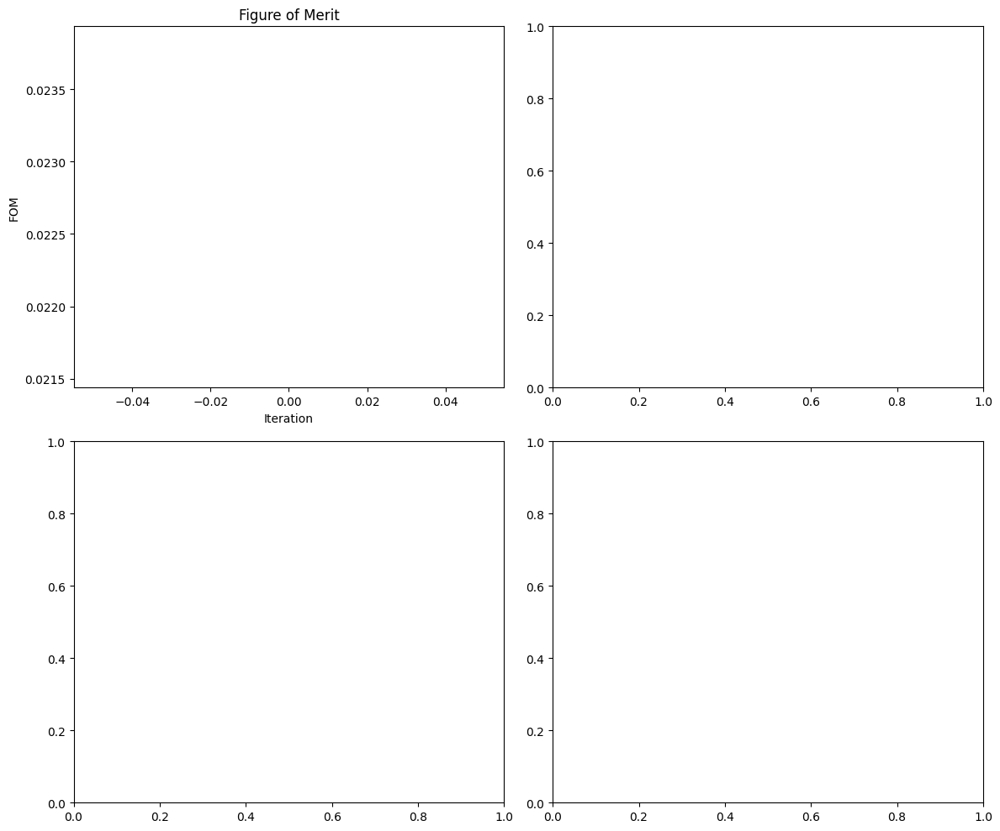

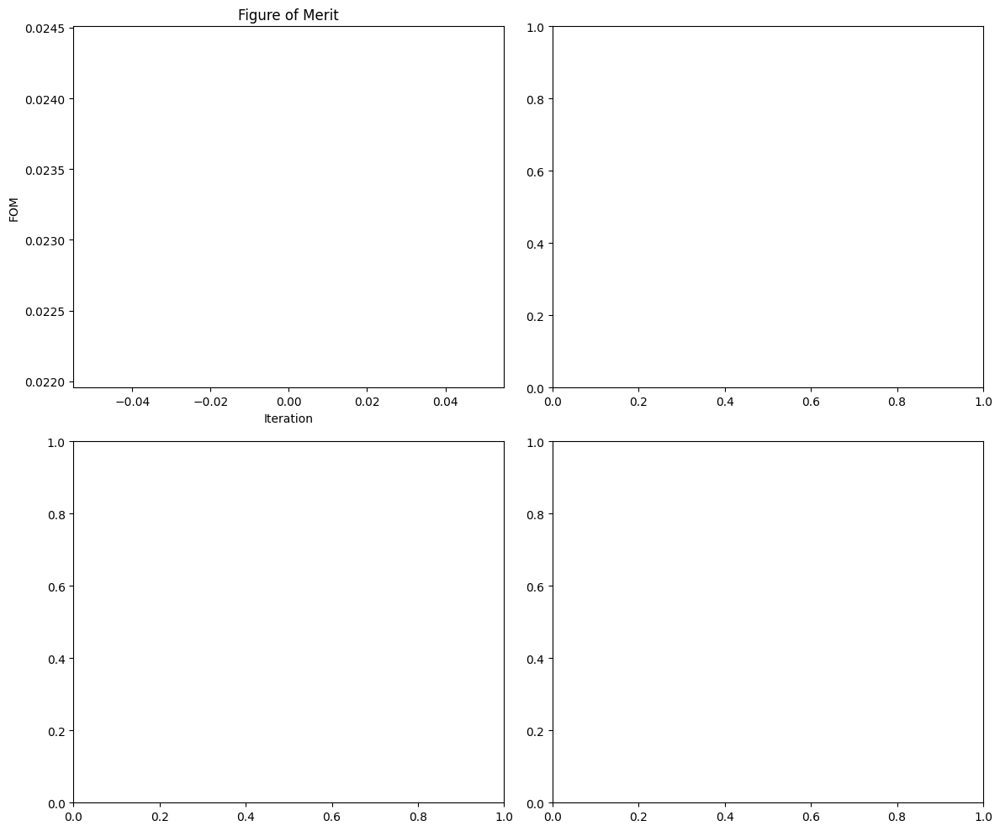

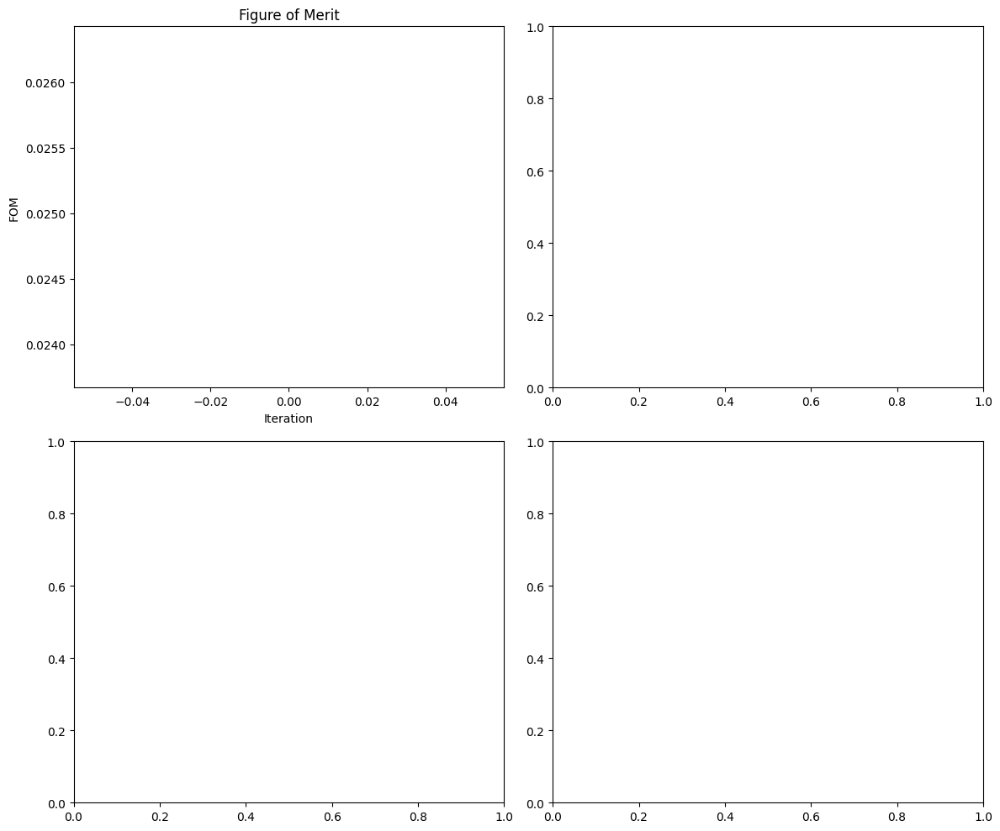

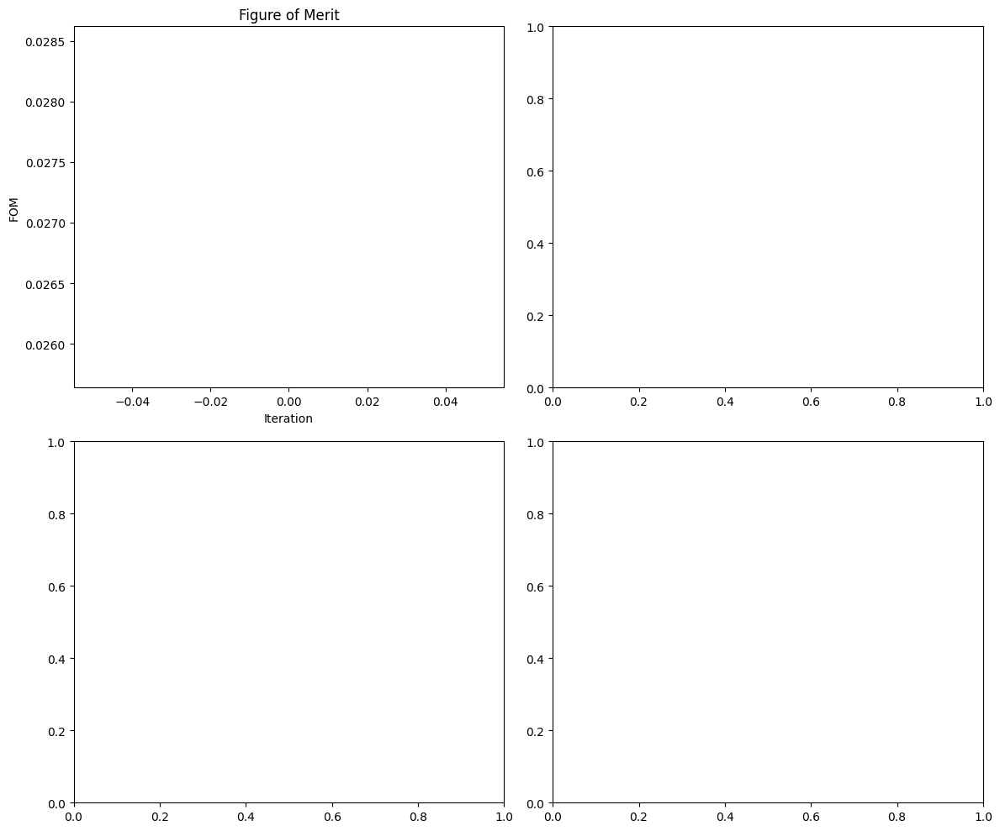

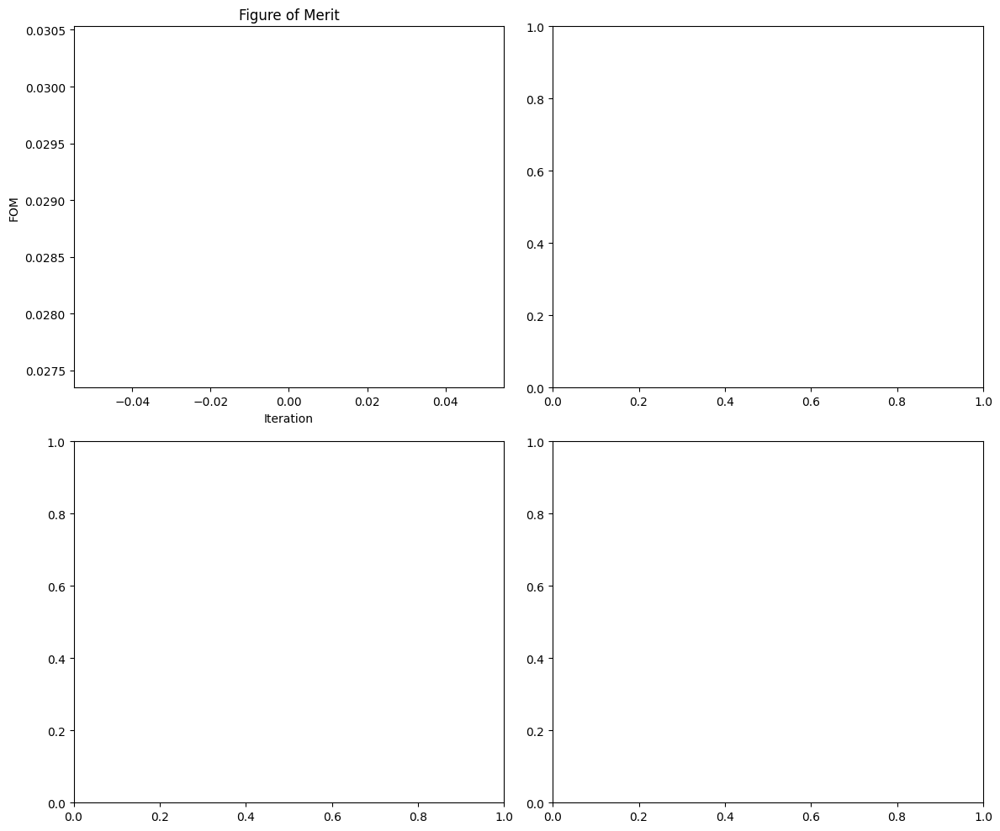

...

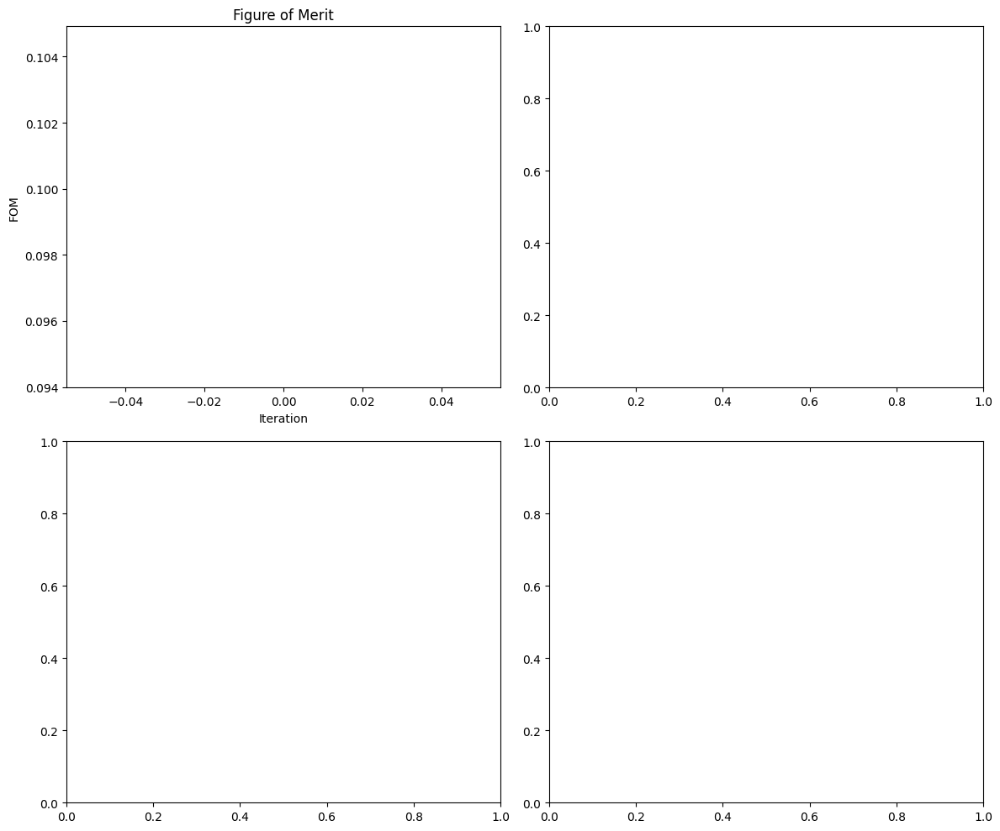

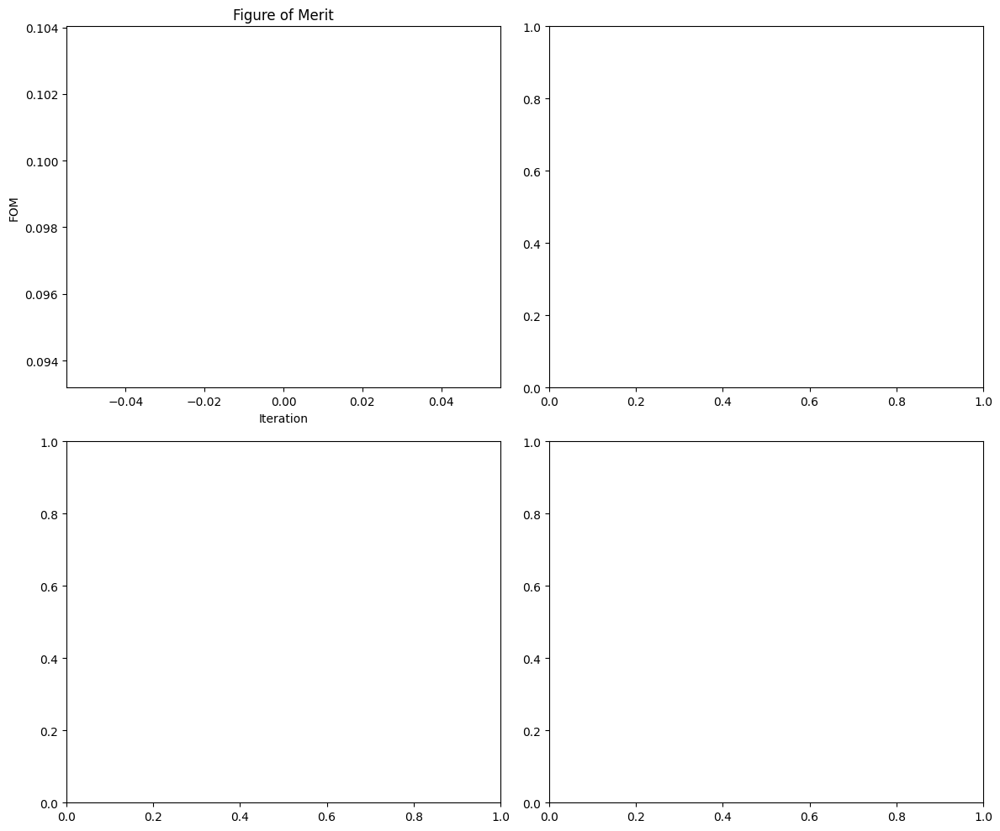

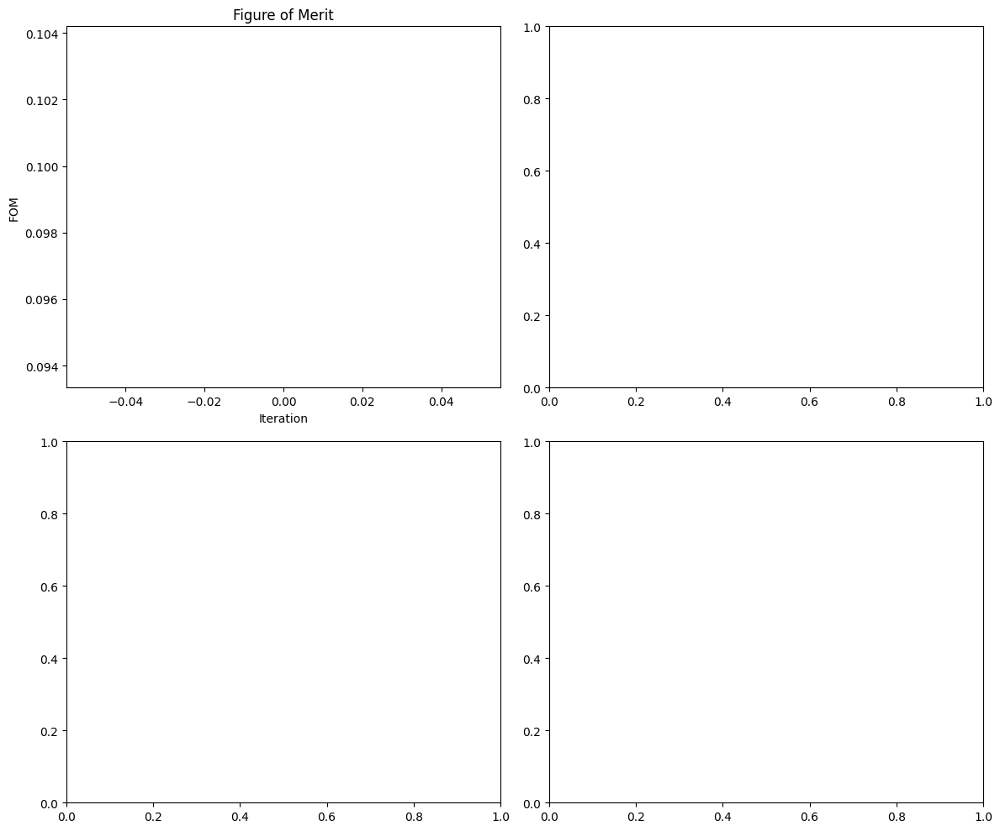

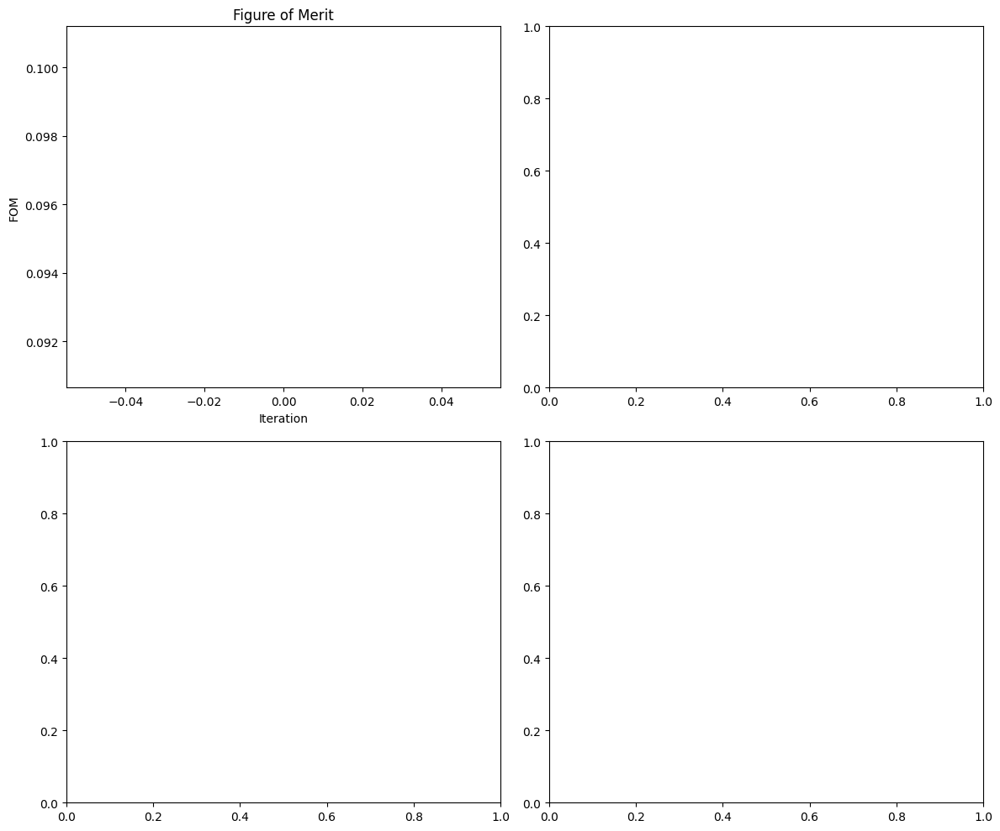

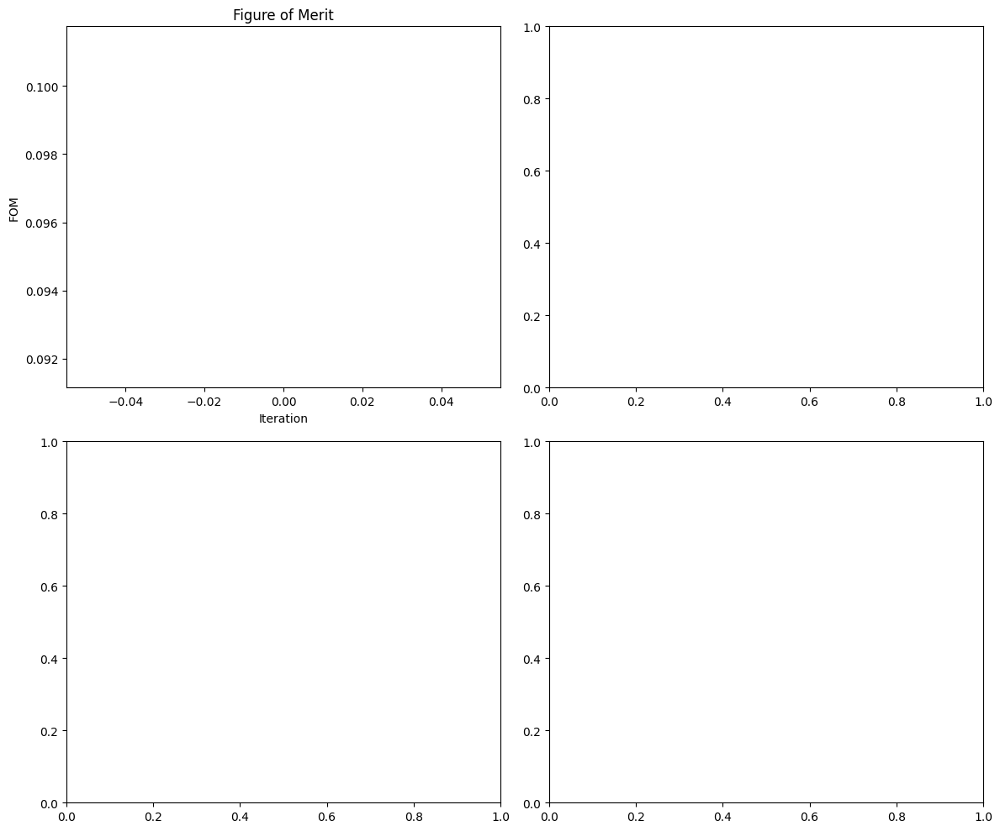

In [7]:
import os

input_dim = 10
hidden_dim = 128
num_blocks = 4
output_dim = 50
num_choices = 50

batch_size = 2

model = ResNetGenerator(input_dim, hidden_dim, num_blocks, output_dim, num_choices)
optimizer = optim.Adam(model.parameters(), lr=0.001)
epochs = 200

loss_history = []
best_loss = float('inf')  # Initialize best loss as infinity

save_dir = 'model_checkpoints'
save_path = os.path.join(save_dir, 'resnet_generator.pth')

# Check if the directory exists, otherwise create it
if not os.path.exists(save_dir):
    try:
        os.makedirs(save_dir)
    except OSError as e:
        print(f"Error creating directory {save_dir}: {e}")
        raise

for epoch in range(epochs):
    
    model.train()
    optimizer.zero_grad()
    
    z = torch.randn(batch_size, input_dim)

    normIter = epoch / epochs
    alpha = model.update_alpha(normIter)
    
    predicted_coords = model(z, alpha)

    loss_batch = torch.zeros(batch_size)  # Pre-allocation

    for i in range(predicted_coords.size(0)):
            
        coords = predicted_coords[i]
        FoM, gradients = FDTD_Simulation(coords.detach().numpy())

        np.savetxt(f'fom.csv', [FoM], delimiter=',')
        np.savetxt(f'gradient.csv', gradients, delimiter=',')

        loss = -lumerical_grad_pytorch(coords)
        loss_batch[i] = loss
        
    loss_final = torch.mean(loss_batch)

    loss_history.append(loss_final.item())
    
    loss_final.backward()
    optimizer.step()
    
    # Check if the loss has improved, save the model if it has
    if loss_final.item() < best_loss:
        best_loss = loss_final.item()
        # Check again before saving the model checkpoint
        if not os.path.exists(save_dir):
            try:
                os.makedirs(save_dir)
            except OSError as e:
                print(f"Error creating directory {save_dir}: {e}")
                raise
        torch.save(model.state_dict(), save_path)
        print(f"Model checkpoint saved at epoch {epoch + 1}, Loss: {best_loss}")

    if (epoch + 1) % 10 == 0:
        print(f"Epoch {epoch + 1}, Loss: {loss_final.item()}")
        print(f'Predicted Coordinates: {predicted_coords}')

# Final model save
torch.save(model.state_dict(), save_path)
print(f'Final model saved to {save_path}')

# Plot loss history
plt.figure()
plt.plot(range(1, epochs + 1), loss_history, label="Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Loss vs Epochs")
plt.legend()
plt.show()
plt.close()